# Лабораторная работа №7  
## Детекция игровых предметов Dota 2 с помощью YOLOv8s

В данной работе выполняется обучение модели детекции объектов на основе YOLOv8s.  
В качестве предметной области выбрана игра **Dota 2**, а объектами детекции являются иконки игровых предметов в интерфейсе.

Цель работы — подготовить датасет, выполнить его предварительную обработку, обучить модель YOLOv8s и проверить качество детекции на тестовой выборке.

В работе используются два источника данных:

1. **Собственный датасет**, размеченный вручную в CVAT.  
   Он содержит скриншоты интерфейса Dota 2 с предметами в инвентаре, рюкзаке, тайнике, quick buy и магазине.  
   Данный набор будет использоваться как тестовая выборка, чтобы проверить модель на собственных изображениях.

2. **Открытый датасет Roboflow**, содержащий изображения и разметку объектов Dota 2.  
   Так как исходный датасет содержит большое количество классов, он будет очищен: будут оставлены только выбранные классы предметов.

В результате будет сформирован итоговый датасет в формате YOLO:

- `train` — обучающая выборка;
- `val` — валидационная выборка;
- `test` — тестовая выборка на основе собственных изображений.

Для обучения будет использоваться модель `YOLOv8s`, так как она является небольшой по размеру, но при этом обычно даёт более устойчивое качество по сравнению с nano-версией.

## Описание классов датасета

Для лабораторной работы были выбраны 13 классов игровых предметов Dota 2.

Выбранные предметы имеют достаточно различимые иконки, часто встречаются в игровом интерфейсе и хорошо подходят для задачи object detection.

Список классов:

| ID | Класс | Предмет |
|---:|---|---|
| 0 | `aghanim_scepter` | Aghanim's Scepter |
| 1 | `black_king_bar` | Black King Bar |
| 2 | `daedalus` | Daedalus |
| 3 | `divine_rapier` | Divine Rapier |
| 4 | `blink_dagger` | Blink Dagger |
| 5 | `boots_of_speed` | Boots of Speed |
| 6 | `scythe_of_vyse` | Scythe of Vyse |
| 7 | `heart_of_tarrasque` | Heart of Tarrasque |
| 8 | `satanic` | Satanic |
| 9 | `butterfly` | Butterfly |
| 10 | `eye_of_skadi` | Eye of Skadi |
| 11 | `radiance` | Radiance |
| 12 | `town_portal_scroll` | Town Portal Scroll |

Важная особенность подготовки датасета заключается в том, что в исходном Roboflow-датасете один и тот же предмет может быть представлен разными классами, например:

- `Blink Dagger`
- `Blink Dagger Inventory`

Для данной лабораторной работы такие варианты будут объединены в один общий класс:

- `blink_dagger`

Это позволит обучить модель определять сам предмет независимо от того, где он находится: в магазине, инвентаре, рюкзаке или quick buy.

In [1]:
from pathlib import Path

PROJECT_DIR = Path.cwd()

MY_CVAT_DIR = PROJECT_DIR / "data" / "my_cvat_export"
ROBOFLOW_DIR = PROJECT_DIR / "data" / "roboflow"
OUTPUT_DIR = PROJECT_DIR / "data" / "dota_items_clean"

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

FINAL_NAMES = [
    "aghanim_scepter",
    "black_king_bar",
    "daedalus",
    "divine_rapier",
    "blink_dagger",
    "boots_of_speed",
    "scythe_of_vyse",
    "heart_of_tarrasque",
    "satanic",
    "butterfly",
    "eye_of_skadi",
    "radiance",
    "town_portal_scroll",
]

print("Рабочая папка проекта:")
print(PROJECT_DIR)

print("\nПапка с собственным CVAT-датасетом:")
print(MY_CVAT_DIR)

print("\nПапка с исходным Roboflow-датасетом:")
print(ROBOFLOW_DIR)

print("\nПапка для итогового очищенного датасета:")
print(OUTPUT_DIR)

print("\nКоличество финальных классов:", len(FINAL_NAMES))

print("\nФинальные классы:")
for class_id, class_name in enumerate(FINAL_NAMES):
    print(f"{class_id:2d}: {class_name}")

Рабочая папка проекта:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7

Папка с собственным CVAT-датасетом:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\my_cvat_export

Папка с исходным Roboflow-датасетом:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\roboflow

Папка для итогового очищенного датасета:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean

Количество финальных классов: 13

Финальные классы:
 0: aghanim_scepter
 1: black_king_bar
 2: daedalus
 3: divine_rapier
 4: blink_dagger
 5: boots_of_speed
 6: scythe_of_vyse
 7: heart_of_tarrasque
 8: satanic
 9: butterfly
10: eye_of_skadi
11: radiance
12: town_portal_scroll


## Проверка структуры исходных данных

Перед объединением датасетов необходимо проверить, что изображения и файлы разметки находятся в ожидаемых папках.

В проекте используются два источника данных:

1. `data/my_cvat_export` — собственный датасет, размеченный вручную в CVAT.
2. `data/roboflow` — открытый датасет Roboflow, который будет очищен и приведён к нужным классам.

Для YOLO-датасета важно, чтобы каждому изображению соответствовал `.txt`-файл разметки с таким же именем.

Например, изображению `example_001.jpg` должен соответствовать файл разметки `example_001.txt`.

Файл разметки YOLO содержит строки формата:

`class_id x_center y_center width height`

где `class_id` — номер класса объекта, а координаты bbox нормализованы относительно размеров изображения и находятся в диапазоне от 0 до 1.

In [2]:
def count_images(images_dir: Path) -> int:
    """
    Подсчитывает количество изображений в указанной папке.
    """
    return sum(
        1 for path in images_dir.iterdir()
        if path.suffix.lower() in IMAGE_EXTENSIONS
    )


def count_labels(labels_dir: Path) -> int:
    """
    Подсчитывает количество YOLO-файлов разметки в указанной папке.
    """
    return sum(
        1 for path in labels_dir.iterdir()
        if path.suffix.lower() == ".txt"
    )


MY_IMAGES_DIR = MY_CVAT_DIR / "images" / "train"
MY_LABELS_DIR = MY_CVAT_DIR / "labels" / "train"

my_images_count = count_images(MY_IMAGES_DIR)
my_labels_count = count_labels(MY_LABELS_DIR)

print("Собственный CVAT-датасет")
print("Изображений:", my_images_count)
print("Файлов разметки:", my_labels_count)

print("\nRoboflow-датасет")

for split in ["train", "valid", "test"]:
    images_dir = ROBOFLOW_DIR / split / "images"
    labels_dir = ROBOFLOW_DIR / split / "labels"

    images_count = count_images(images_dir)
    labels_count = count_labels(labels_dir)

    print(f"{split:5s}: images = {images_count:4d}, labels = {labels_count:4d}")

Собственный CVAT-датасет
Изображений: 112
Файлов разметки: 112

Roboflow-датасет
train: images = 2373, labels = 2373
valid: images =  360, labels =  360
test : images =  179, labels =  179


In [3]:
def collect_image_stems(images_dir: Path) -> set[str]:
    """
    Собирает имена изображений без расширений.
    """
    return {
        path.stem
        for path in images_dir.iterdir()
        if path.suffix.lower() in IMAGE_EXTENSIONS
    }


def collect_label_stems(labels_dir: Path) -> set[str]:
    """
    Собирает имена файлов разметки без расширений.
    """
    return {
        path.stem
        for path in labels_dir.iterdir()
        if path.suffix.lower() == ".txt"
    }


my_image_stems = collect_image_stems(MY_IMAGES_DIR)
my_label_stems = collect_label_stems(MY_LABELS_DIR)

my_images_without_labels = my_image_stems - my_label_stems
my_labels_without_images = my_label_stems - my_image_stems

print("Проверка собственного CVAT-датасета")
print("Изображений без разметки:", len(my_images_without_labels))
print("Разметок без изображения:", len(my_labels_without_images))

print("\nПроверка Roboflow-датасета")

for split in ["train", "valid", "test"]:
    images_dir = ROBOFLOW_DIR / split / "images"
    labels_dir = ROBOFLOW_DIR / split / "labels"

    image_stems = collect_image_stems(images_dir)
    label_stems = collect_label_stems(labels_dir)

    images_without_labels = image_stems - label_stems
    labels_without_images = label_stems - image_stems

    print(f"\n{split}")
    print("Изображений без разметки:", len(images_without_labels))
    print("Разметок без изображения:", len(labels_without_images))

Проверка собственного CVAT-датасета
Изображений без разметки: 0
Разметок без изображения: 0

Проверка Roboflow-датасета

train
Изображений без разметки: 0
Разметок без изображения: 0

valid
Изображений без разметки: 0
Разметок без изображения: 0

test
Изображений без разметки: 0
Разметок без изображения: 0


## Подготовка соответствия классов Roboflow

Исходный Roboflow-датасет содержит большое количество классов: предметы, героев, миникарту, элементы интерфейса и служебные объекты.

Для данной лабораторной работы используются только 13 классов предметов Dota 2. Поэтому необходимо выполнить фильтрацию исходной разметки:

1. Прочитать список классов Roboflow из `data.yaml`.
2. Найти в нём нужные предметы.
3. Объединить обычные версии предметов и версии `Inventory` в один финальный класс.

Например, классы Roboflow `Blink Dagger` и `Blink Dagger Inventory` будут преобразованы в один класс `blink_dagger`.

Такой подход позволяет обучать модель определять предмет независимо от того, где он расположен: в магазине, инвентаре, рюкзаке, тайнике или quick buy.

In [4]:
import ast

roboflow_yaml_path = ROBOFLOW_DIR / "data.yaml"

roboflow_yaml_text = roboflow_yaml_path.read_text(encoding="utf-8")

print(roboflow_yaml_text[:1000])

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 375
names: ['Abyssal Blade', 'Abyssal Blade Inventory', 'Aeon Disk', 'Aeon Disk Inventory', 'Aether Lens', 'Aether Lens Inventory', 'Aghanim-s Scepter', 'Aghanim-s Scepter Inventory', 'Aghanim-s Shard', 'Anti-Mage', 'Anti-Mage_mini_map', 'Arcane Blink', 'Arcane Blink Inventory', 'Arcane Boots', 'Arcane Boots Inventory', 'Armlet of Mordiggian', 'Armlet of Mordiggian Inventory', 'Assault Cuirass', 'Assault Cuirass Inventory', 'Band of Elvenskin', 'Band of Elvenskin Inventory', 'Battle Fury', 'Battle Fury Inventory', 'Belt of Strength', 'Belt of Strength Inventory', 'Black King Bar', 'Black King Bar Inventory', 'Blade Mail', 'Blade Mail Inventory', 'Blade of Alacrity', 'Blade of Alacrity Inventory', 'Blades of Attack', 'Blades of Attack Inventory', 'Blight Stone', 'Blight Stone Inventory', 'Blink Dagger', 'Blink Dagger Inventory', 'Blitz Knuckles', 'Blitz Knuckles Inventory', 'Blood Grenade', 'Blood Grenade Inventory', 

In [5]:
def read_names_from_roboflow_yaml(yaml_path: Path) -> list[str]:
    """
    Читает список классов из data.yaml Roboflow.
    """
    yaml_text = yaml_path.read_text(encoding="utf-8")

    names_line = [
        line for line in yaml_text.splitlines()
        if line.startswith("names:")
    ][0]

    names_text = names_line.replace("names:", "", 1).strip()
    names = ast.literal_eval(names_text)

    return names


ROBOFLOW_NAMES = read_names_from_roboflow_yaml(ROBOFLOW_DIR / "data.yaml")

print("Количество классов в Roboflow:", len(ROBOFLOW_NAMES))

print("\nПервые 40 классов Roboflow:")
for class_id, class_name in enumerate(ROBOFLOW_NAMES[:40]):
    print(f"{class_id:3d}: {class_name}")

Количество классов в Roboflow: 375

Первые 40 классов Roboflow:
  0: Abyssal Blade
  1: Abyssal Blade Inventory
  2: Aeon Disk
  3: Aeon Disk Inventory
  4: Aether Lens
  5: Aether Lens Inventory
  6: Aghanim-s Scepter
  7: Aghanim-s Scepter Inventory
  8: Aghanim-s Shard
  9: Anti-Mage
 10: Anti-Mage_mini_map
 11: Arcane Blink
 12: Arcane Blink Inventory
 13: Arcane Boots
 14: Arcane Boots Inventory
 15: Armlet of Mordiggian
 16: Armlet of Mordiggian Inventory
 17: Assault Cuirass
 18: Assault Cuirass Inventory
 19: Band of Elvenskin
 20: Band of Elvenskin Inventory
 21: Battle Fury
 22: Battle Fury Inventory
 23: Belt of Strength
 24: Belt of Strength Inventory
 25: Black King Bar
 26: Black King Bar Inventory
 27: Blade Mail
 28: Blade Mail Inventory
 29: Blade of Alacrity
 30: Blade of Alacrity Inventory
 31: Blades of Attack
 32: Blades of Attack Inventory
 33: Blight Stone
 34: Blight Stone Inventory
 35: Blink Dagger
 36: Blink Dagger Inventory
 37: Blitz Knuckles
 38: Blitz Knu

## Преобразование классов Roboflow к выбранным классам

В исходном Roboflow-датасете один и тот же предмет может быть представлен несколькими классами.

Например:

- `Black King Bar`
- `Black King Bar Inventory`

Для нашей задачи это один и тот же предмет, поэтому оба класса будут преобразованы в общий класс `black_king_bar`.

Также из исходной разметки будут удалены все объекты, которые не относятся к выбранным 13 предметам.

In [6]:
ROBOFLOW_TO_FINAL = {
    "Aghanim-s Scepter": "aghanim_scepter",
    "Aghanim-s Scepter Inventory": "aghanim_scepter",

    "Black King Bar": "black_king_bar",
    "Black King Bar Inventory": "black_king_bar",

    "Daedalus": "daedalus",
    "Daedalus Inventory": "daedalus",

    "Divine Rapier": "divine_rapier",
    "Divine Rapier 25- bonus spell amplification Inventory": "divine_rapier",
    "Divine Rapier 250 bonus attack damage Inventory": "divine_rapier",

    "Blink Dagger": "blink_dagger",
    "Blink Dagger Inventory": "blink_dagger",

    "Boots of Speed": "boots_of_speed",
    "Boots of Speed Inventory": "boots_of_speed",

    "Scythe of Vyse": "scythe_of_vyse",
    "Scythe of Vyse Inventory": "scythe_of_vyse",

    "Heart of Tarrasque": "heart_of_tarrasque",
    "Heart of Tarrasque Inventory": "heart_of_tarrasque",

    "Satanic": "satanic",
    "Satanic Inventory": "satanic",

    "Butterfly": "butterfly",
    "Butterfly Inventory": "butterfly",

    "Eye of Skadi": "eye_of_skadi",
    "Eye of Skadi Inventory": "eye_of_skadi",

    "Radiance": "radiance",
    "Radiance Inventory": "radiance",

    "Town Portal Scroll": "town_portal_scroll",
    "Town Portal Scroll Inventory": "town_portal_scroll",
}

In [7]:
final_name_to_id = {
    class_name: class_id
    for class_id, class_name in enumerate(FINAL_NAMES)
}

roboflow_class_mapping = {}

for old_class_id, old_class_name in enumerate(ROBOFLOW_NAMES):
    if old_class_name in ROBOFLOW_TO_FINAL:
        final_class_name = ROBOFLOW_TO_FINAL[old_class_name]
        new_class_id = final_name_to_id[final_class_name]
        roboflow_class_mapping[old_class_id] = new_class_id

print("Найдено классов Roboflow для преобразования:", len(roboflow_class_mapping))

print("\nСоответствие классов:")
for old_class_id, new_class_id in roboflow_class_mapping.items():
    old_class_name = ROBOFLOW_NAMES[old_class_id]
    new_class_name = FINAL_NAMES[new_class_id]
    print(f"{old_class_id:3d} | {old_class_name:55s} -> {new_class_id:2d} | {new_class_name}")

Найдено классов Roboflow для преобразования: 27

Соответствие классов:
  6 | Aghanim-s Scepter                                       ->  0 | aghanim_scepter
  7 | Aghanim-s Scepter Inventory                             ->  0 | aghanim_scepter
 25 | Black King Bar                                          ->  1 | black_king_bar
 26 | Black King Bar Inventory                                ->  1 | black_king_bar
 35 | Blink Dagger                                            ->  4 | blink_dagger
 36 | Blink Dagger Inventory                                  ->  4 | blink_dagger
 47 | Boots of Speed                                          ->  5 | boots_of_speed
 48 | Boots of Speed Inventory                                ->  5 | boots_of_speed
 59 | Butterfly                                               ->  9 | butterfly
 60 | Butterfly Inventory                                     ->  9 | butterfly
 81 | Daedalus                                                ->  2 | daedalus
 82 | Daedal

## Анализ количества объектов в Roboflow-датасете

После подготовки соответствия классов необходимо проверить, сколько объектов каждого выбранного предмета есть в исходном Roboflow-датасете.

Это важный этап, потому что даже если класс присутствует в `data.yaml`, объектов этого класса может быть мало.  
Если для какого-то предмета будет слишком мало bbox-разметок, модель может плохо обучиться распознавать этот класс.

На этом шаге будет выполнен подсчёт объектов только для выбранных 13 классов.

In [8]:
from collections import Counter

roboflow_object_counts = Counter()

for split in ["train", "valid", "test"]:
    labels_dir = ROBOFLOW_DIR / split / "labels"

    for label_path in labels_dir.iterdir():
        if label_path.suffix.lower() != ".txt":
            continue

        lines = label_path.read_text(encoding="utf-8").splitlines()

        for line in lines:
            parts = line.strip().split()
            old_class_id = int(parts[0])

            if old_class_id in roboflow_class_mapping:
                new_class_id = roboflow_class_mapping[old_class_id]
                roboflow_object_counts[new_class_id] += 1

print("Количество объектов выбранных классов в Roboflow:")

for class_id, class_name in enumerate(FINAL_NAMES):
    count = roboflow_object_counts[class_id]
    print(f"{class_id:2d} | {class_name:20s} | {count:4d} объектов")

Количество объектов выбранных классов в Roboflow:
 0 | aghanim_scepter      |  729 объектов
 1 | black_king_bar       |  740 объектов
 2 | daedalus             |  724 объектов
 3 | divine_rapier        |  774 объектов
 4 | blink_dagger         |  202 объектов
 5 | boots_of_speed       |  243 объектов
 6 | scythe_of_vyse       |  724 объектов
 7 | heart_of_tarrasque   |  698 объектов
 8 | satanic              |  719 объектов
 9 | butterfly            |  751 объектов
10 | eye_of_skadi         |  737 объектов
11 | radiance             |  734 объектов
12 | town_portal_scroll   | 1749 объектов


In [9]:
import pandas as pd

roboflow_stats = pd.DataFrame(
    [
        {
            "class_id": class_id,
            "class_name": class_name,
            "objects_count": roboflow_object_counts[class_id],
        }
        for class_id, class_name in enumerate(FINAL_NAMES)
    ]
)

roboflow_stats

,class_id,class_name,objects_count
0,0,aghanim_scepter,729
1,1,black_king_bar,740
2,2,daedalus,724
3,3,divine_rapier,774
4,4,blink_dagger,202
5,5,boots_of_speed,243
6,6,scythe_of_vyse,724
7,7,heart_of_tarrasque,698
8,8,satanic,719
9,9,butterfly,751


## Вывод по количеству объектов в Roboflow-датасете

После анализа исходного Roboflow-датасета были найдены все выбранные классы предметов.  
Всего для преобразования было найдено 27 исходных классов Roboflow, так как многие предметы представлены в нескольких вариантах: обычная версия предмета и версия `Inventory`.

Количество объектов по выбранным классам достаточно большое:

- почти все предметы имеют более 700 размеченных объектов;
- `blink_dagger` и `boots_of_speed` представлены меньше остальных, но всё равно имеют более 200 объектов;
- `town_portal_scroll` встречается чаще всего — более 1700 объектов.

Это означает, что Roboflow-датасет подходит для формирования обучающей и валидационной выборки.  
При этом исходный датасет необходимо очистить: оставить только выбранные 13 классов и удалить все остальные объекты из разметки.

## Анализ собственного тестового датасета

Собственный датасет был размечен вручную в CVAT и содержит 112 изображений.

В итоговой работе он будет использоваться как тестовая выборка.  
Такой подход позволяет проверить модель на изображениях, которые не участвовали в обучении и были подготовлены отдельно от Roboflow-датасета.

На данном этапе необходимо посчитать количество объектов каждого класса в собственной разметке.  
Это позволит понять, насколько тестовая выборка сбалансирована и все ли выбранные предметы в ней представлены.

In [10]:
my_object_counts = Counter()

for label_path in MY_LABELS_DIR.iterdir():
    lines = label_path.read_text(encoding="utf-8").splitlines()

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        my_object_counts[class_id] += 1

print("Количество объектов выбранных классов в собственном CVAT-датасете:")

for class_id, class_name in enumerate(FINAL_NAMES):
    count = my_object_counts[class_id]
    print(f"{class_id:2d} | {class_name:20s} | {count:4d} объектов")

Количество объектов выбранных классов в собственном CVAT-датасете:
 0 | aghanim_scepter      |   96 объектов
 1 | black_king_bar       |   88 объектов
 2 | daedalus             |  184 объектов
 3 | divine_rapier        |   96 объектов
 4 | blink_dagger         |  296 объектов
 5 | boots_of_speed       |  184 объектов
 6 | scythe_of_vyse       |  112 объектов
 7 | heart_of_tarrasque   |  112 объектов
 8 | satanic              |  120 объектов
 9 | butterfly            |  112 объектов
10 | eye_of_skadi         |  112 объектов
11 | radiance             |  112 объектов
12 | town_portal_scroll   |  112 объектов


## Вывод по собственному тестовому датасету

В собственном CVAT-датасете содержится 112 изображений.  
Все изображения имеют соответствующие файлы разметки, поэтому датасет корректно экспортирован из CVAT.

По результатам подсчёта объектов видно, что все 13 выбранных классов представлены в тестовой выборке.

Минимальное количество объектов имеет класс `black_king_bar` — 88 объектов.  
Максимальное количество объектов имеет класс `blink_dagger` — 296 объектов.

Такое распределение подходит для тестирования модели, так как каждый класс представлен достаточным количеством примеров.  
Собственный датасет будет использоваться как независимая тестовая выборка, а обучение и валидация будут выполняться на очищенной части Roboflow-датасета.

In [11]:
my_stats = pd.DataFrame(
    [
        {
            "class_id": class_id,
            "class_name": class_name,
            "objects_count": my_object_counts[class_id],
        }
        for class_id, class_name in enumerate(FINAL_NAMES)
    ]
)

my_stats

,class_id,class_name,objects_count
0,0,aghanim_scepter,96
1,1,black_king_bar,88
2,2,daedalus,184
3,3,divine_rapier,96
4,4,blink_dagger,296
5,5,boots_of_speed,184
6,6,scythe_of_vyse,112
7,7,heart_of_tarrasque,112
8,8,satanic,120
9,9,butterfly,112


## Формирование итогового датасета

После анализа исходных данных можно сформировать итоговый датасет для обучения YOLOv8s.

Итоговая структура будет следующей:

- `train` — очищенная обучающая часть Roboflow-датасета;
- `val` — очищенная валидационная часть Roboflow-датасета;
- `test` — собственный датасет, размеченный вручную в CVAT.

Такой подход позволяет обучить модель на открытом наборе данных и затем проверить её на собственных изображениях, которые не участвовали в обучении.

При формировании итогового датасета будут выполнены следующие действия:

1. Из Roboflow-разметки будут удалены все объекты, не относящиеся к выбранным 13 предметам.
2. Исходные классы Roboflow будут преобразованы к новым ID классов от 0 до 12.
3. Изображения Roboflow, в которых после фильтрации не осталось нужных объектов, не будут использоваться.
4. Собственные изображения из CVAT будут скопированы в тестовую выборку без изменения ID классов.

In [12]:
import shutil

if OUTPUT_DIR.exists():
    shutil.rmtree(OUTPUT_DIR)

for split in ["train", "val", "test"]:
    (OUTPUT_DIR / "images" / split).mkdir(parents=True, exist_ok=True)
    (OUTPUT_DIR / "labels" / split).mkdir(parents=True, exist_ok=True)

print("Создана структура итогового датасета:")
print(OUTPUT_DIR)

for split in ["train", "val", "test"]:
    print(" -", OUTPUT_DIR / "images" / split)
    print(" -", OUTPUT_DIR / "labels" / split)

Создана структура итогового датасета:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\train
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\labels\train
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\val
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\labels\val
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\labels\test


In [13]:
def find_image_by_stem(images_dir: Path, stem: str) -> Path:
    """
    Находит изображение по имени файла без расширения.
    """
    candidates = [
        path
        for path in images_dir.iterdir()
        if path.stem == stem and path.suffix.lower() in IMAGE_EXTENSIONS
    ]

    return candidates[0]


def read_filtered_roboflow_labels(label_path: Path) -> list[str]:
    """
    Читает файл YOLO-разметки Roboflow и оставляет только выбранные классы.
    """
    filtered_lines = []

    for line in label_path.read_text(encoding="utf-8").splitlines():
        parts = line.strip().split()
        old_class_id = int(parts[0])

        if old_class_id in roboflow_class_mapping:
            new_class_id = roboflow_class_mapping[old_class_id]
            parts[0] = str(new_class_id)
            filtered_lines.append(" ".join(parts))

    return filtered_lines

In [14]:
def copy_roboflow_split(source_split: str, target_split: str) -> int:
    """
    Копирует часть Roboflow-датасета в итоговый датасет с фильтрацией классов.
    """
    source_images_dir = ROBOFLOW_DIR / source_split / "images"
    source_labels_dir = ROBOFLOW_DIR / source_split / "labels"

    target_images_dir = OUTPUT_DIR / "images" / target_split
    target_labels_dir = OUTPUT_DIR / "labels" / target_split

    copied_count = 0

    for label_path in source_labels_dir.iterdir():
        if label_path.suffix.lower() != ".txt":
            continue

        filtered_lines = read_filtered_roboflow_labels(label_path)

        if len(filtered_lines) == 0:
            continue

        image_path = find_image_by_stem(source_images_dir, label_path.stem)

        new_stem = f"rf_{source_split}_{copied_count:05d}"
        new_image_path = target_images_dir / f"{new_stem}{image_path.suffix.lower()}"
        new_label_path = target_labels_dir / f"{new_stem}.txt"

        shutil.copy2(image_path, new_image_path)
        new_label_path.write_text("\n".join(filtered_lines) + "\n", encoding="utf-8")

        copied_count += 1

    return copied_count


train_copied = copy_roboflow_split("train", "train")
val_copied = copy_roboflow_split("valid", "val")

print("Скопировано изображений из Roboflow:")
print("train:", train_copied)
print("val:", val_copied)

Скопировано изображений из Roboflow:
train: 1582
val: 230


## Добавление собственного датасета в тестовую выборку

После очистки Roboflow-датасета обучающая и валидационная выборки уже сформированы.

Теперь необходимо добавить собственный датасет, размеченный вручную в CVAT.  
Он будет использоваться как тестовая выборка.

Такой подход удобен, потому что модель будет обучаться на открытом датасете Roboflow, а проверяться на собственных изображениях, которые были собраны и размечены отдельно. Это позволяет оценить, насколько модель способна работать с новыми данными.

In [15]:
def copy_my_cvat_to_test() -> int:
    """
    Копирует собственный CVAT-датасет в тестовую часть итогового датасета.
    """
    target_images_dir = OUTPUT_DIR / "images" / "test"
    target_labels_dir = OUTPUT_DIR / "labels" / "test"

    copied_count = 0

    for label_path in MY_LABELS_DIR.iterdir():
        if label_path.suffix.lower() != ".txt":
            continue

        image_path = find_image_by_stem(MY_IMAGES_DIR, label_path.stem)

        new_stem = f"my_test_{copied_count:05d}"
        new_image_path = target_images_dir / f"{new_stem}{image_path.suffix.lower()}"
        new_label_path = target_labels_dir / f"{new_stem}.txt"

        shutil.copy2(image_path, new_image_path)
        shutil.copy2(label_path, new_label_path)

        copied_count += 1

    return copied_count


test_copied = copy_my_cvat_to_test()

print("Скопировано собственных изображений в test:", test_copied)

Скопировано собственных изображений в test: 112


In [16]:
print("Итоговый датасет:")

for split in ["train", "val", "test"]:
    images_dir = OUTPUT_DIR / "images" / split
    labels_dir = OUTPUT_DIR / "labels" / split

    images_count = count_images(images_dir)
    labels_count = count_labels(labels_dir)

    print(f"{split:5s}: images = {images_count:4d}, labels = {labels_count:4d}")

Итоговый датасет:
train: images = 1582, labels = 1582
val  : images =  230, labels =  230
test : images =  112, labels =  112


## Вывод по сформированной структуре датасета

После очистки Roboflow-датасета и добавления собственного CVAT-датасета была сформирована итоговая структура данных для обучения YOLOv8s.

Итоговый датасет содержит:

- `train` — 1582 изображения из очищенного Roboflow-датасета;
- `val` — 230 изображений из очищенного Roboflow-датасета;
- `test` — 112 собственных изображений, размеченных вручную в CVAT.

Несмотря на то, что минимальное требование к обучающей выборке составляет 150–500 изображений, в работе используется большее количество данных. Это для повышения качества обучения, так как модель получает больше разнообразных примеров предметов.

Тестовая выборка отделена от обучающей и состоит только из собственных изображений. Это позволяет проверить качество модели на данных, которые не использовались во время обучения.

In [17]:
data_yaml_text = f"""path: {OUTPUT_DIR.resolve().as_posix()}
train: images/train
val: images/val
test: images/test

nc: {len(FINAL_NAMES)}

names:
"""

for class_id, class_name in enumerate(FINAL_NAMES):
    data_yaml_text += f"  {class_id}: {class_name}\n"

data_yaml_path = OUTPUT_DIR / "data.yaml"
data_yaml_path.write_text(data_yaml_text, encoding="utf-8")

print("Файл data.yaml создан:")
print(data_yaml_path)

print("\nСодержимое data.yaml:")
print(data_yaml_text)

Файл data.yaml создан:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\data.yaml

Содержимое data.yaml:
path: C:/Users/motyn/Desktop/repositories/_OMSTU/CV/lab_7/data/dota_items_clean
train: images/train
val: images/val
test: images/test

nc: 13

names:
  0: aghanim_scepter
  1: black_king_bar
  2: daedalus
  3: divine_rapier
  4: blink_dagger
  5: boots_of_speed
  6: scythe_of_vyse
  7: heart_of_tarrasque
  8: satanic
  9: butterfly
  10: eye_of_skadi
  11: radiance
  12: town_portal_scroll



In [18]:
final_dataset_counts = []

for split in ["train", "val", "test"]:
    images_dir = OUTPUT_DIR / "images" / split
    labels_dir = OUTPUT_DIR / "labels" / split

    images_count = count_images(images_dir)
    labels_count = count_labels(labels_dir)

    final_dataset_counts.append(
        {
            "split": split,
            "images": images_count,
            "labels": labels_count,
        }
    )

final_dataset_stats = pd.DataFrame(final_dataset_counts)

final_dataset_stats

,split,images,labels
0,train,1582,1582
1,val,230,230
2,test,112,112


## Проверка распределения объектов в итоговом датасете

После формирования итоговой структуры необходимо проверить не только количество изображений, но и количество размеченных объектов каждого класса.

Это важно, потому что для обучения детектора объектов количество изображений само по себе не всегда отражает качество датасета. На одном изображении может находиться несколько объектов, а некоторые классы могут встречаться значительно чаще других.

На данном этапе будет подсчитано количество bbox-разметок для каждого класса отдельно в `train`, `val` и `test`.

In [19]:
def count_objects_by_class(labels_dir: Path) -> Counter:
    """
    Подсчитывает количество объектов каждого класса в папке с YOLO-разметкой.
    """
    object_counts = Counter()

    for label_path in labels_dir.iterdir():
        if label_path.suffix.lower() != ".txt":
            continue

        lines = label_path.read_text(encoding="utf-8").splitlines()

        for line in lines:
            parts = line.strip().split()
            class_id = int(parts[0])
            object_counts[class_id] += 1

    return object_counts


split_object_counts = {
    split: count_objects_by_class(OUTPUT_DIR / "labels" / split)
    for split in ["train", "val", "test"]
}

objects_distribution = pd.DataFrame(
    [
        {
            "class_id": class_id,
            "class_name": class_name,
            "train": split_object_counts["train"][class_id],
            "val": split_object_counts["val"][class_id],
            "test": split_object_counts["test"][class_id],
            "total": (
                split_object_counts["train"][class_id]
                + split_object_counts["val"][class_id]
                + split_object_counts["test"][class_id]
            ),
        }
        for class_id, class_name in enumerate(FINAL_NAMES)
    ]
)

objects_distribution

,class_id,class_name,train,val,test,total
0,0,aghanim_scepter,591,92,96,779
1,1,black_king_bar,616,82,88,786
2,2,daedalus,589,93,184,866
3,3,divine_rapier,641,88,96,825
4,4,blink_dagger,175,18,296,489
5,5,boots_of_speed,222,14,184,420
6,6,scythe_of_vyse,590,88,112,790
7,7,heart_of_tarrasque,575,84,112,771
8,8,satanic,582,89,120,791
9,9,butterfly,604,100,112,816


In [20]:
print("Общее количество объектов по частям датасета:")

for split in ["train", "val", "test"]:
    total_objects = sum(split_object_counts[split].values())
    print(f"{split:5s}: {total_objects:5d} объектов")

print("\nМинимальное количество объектов по классам:")

for split in ["train", "val", "test"]:
    min_count = min(split_object_counts[split][class_id] for class_id in range(len(FINAL_NAMES)))
    max_count = max(split_object_counts[split][class_id] for class_id in range(len(FINAL_NAMES)))
    print(f"{split:5s}: min = {min_count:4d}, max = {max_count:4d}")

Общее количество объектов по частям датасета:
train:  7812 объектов
val  :  1136 объектов
test :  1736 объектов

Минимальное количество объектов по классам:
train: min =  175, max = 1433
val  : min =   14, max =  206
test : min =   88, max =  296


## Вывод по распределению объектов в итоговом датасете

После формирования итогового датасета было проверено количество объектов каждого класса в частях `train`, `val` и `test`.

Обучающая выборка содержит 7812 объектов, что достаточно для обучения YOLOv8s на выбранных 13 классах предметов.  
Валидационная выборка содержит 1136 объектов и будет использоваться для оценки качества модели во время обучения.  
Тестовая выборка содержит 1736 объектов и состоит из собственных изображений, размеченных вручную в CVAT.

Минимальное количество объектов в обучающей выборке равно 175, что является приемлемым значением для лабораторной работы.  
В тестовой выборке минимальное количество объектов равно 88, поэтому каждый класс представлен достаточным количеством примеров для финальной проверки.

Наиболее несбалансированным классом является `town_portal_scroll`, так как он встречается заметно чаще остальных.  
Однако это не является критической проблемой, потому что остальные классы также имеют достаточное количество объектов.

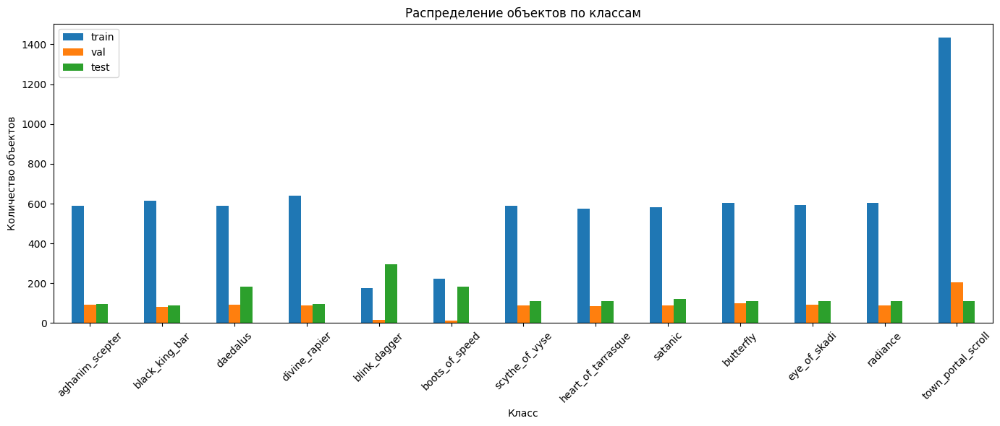

In [21]:
import matplotlib.pyplot as plt

objects_distribution_plot = objects_distribution.set_index("class_name")[["train", "val", "test"]]

ax = objects_distribution_plot.plot(
    kind="bar",
    figsize=(14, 6),
)

ax.set_title("Распределение объектов по классам")
ax.set_xlabel("Класс")
ax.set_ylabel("Количество объектов")
ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

## Визуальная проверка разметки

Перед обучением модели полезно визуально проверить несколько изображений с bbox-разметкой.

Это позволяет убедиться, что:

- изображения корректно скопированы в итоговый датасет;
- файлы `.txt` соответствуют изображениям;
- координаты bbox правильно читаются;
- классы объектов отображаются корректно;
- рамки действительно находятся вокруг иконок предметов.

Далее будет выведено несколько случайных изображений из итогового датасета с нанесёнными bounding boxes.

In [22]:
import random
from PIL import Image
import matplotlib.patches as patches


def read_yolo_labels(label_path: Path) -> list[tuple[int, float, float, float, float]]:
    """
    Читает YOLO-разметку из .txt-файла.
    """
    labels = []

    for line in label_path.read_text(encoding="utf-8").splitlines():
        parts = line.strip().split()

        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        labels.append((class_id, x_center, y_center, width, height))

    return labels


def yolo_to_xyxy(
    x_center: float,
    y_center: float,
    width: float,
    height: float,
    image_width: int,
    image_height: int,
) -> tuple[float, float, float, float]:
    """
    Преобразует YOLO-координаты bbox в координаты углов прямоугольника.
    """
    x_min = (x_center - width / 2) * image_width
    y_min = (y_center - height / 2) * image_height
    x_max = (x_center + width / 2) * image_width
    y_max = (y_center + height / 2) * image_height

    return x_min, y_min, x_max, y_max

In [23]:
def find_image_by_label_path(split: str, label_path: Path) -> Path:
    """
    Находит изображение для файла разметки из итогового датасета.
    """
    images_dir = OUTPUT_DIR / "images" / split

    candidates = [
        path
        for path in images_dir.iterdir()
        if path.stem == label_path.stem and path.suffix.lower() in IMAGE_EXTENSIONS
    ]

    return candidates[0]


def show_labeled_image(split: str, label_path: Path) -> None:
    """
    Отображает изображение с нанесёнными bbox-разметками.
    """
    image_path = find_image_by_label_path(split, label_path)
    image = Image.open(image_path).convert("RGB")

    image_width, image_height = image.size
    labels = read_yolo_labels(label_path)

    fig, ax = plt.subplots(figsize=(16, 9))
    ax.imshow(image)
    ax.axis("off")
    ax.set_title(f"{split}: {image_path.name}")

    for class_id, x_center, y_center, width, height in labels:
        x_min, y_min, x_max, y_max = yolo_to_xyxy(
            x_center=x_center,
            y_center=y_center,
            width=width,
            height=height,
            image_width=image_width,
            image_height=image_height,
        )

        rect_width = x_max - x_min
        rect_height = y_max - y_min

        rectangle = patches.Rectangle(
            (x_min, y_min),
            rect_width,
            rect_height,
            fill=False,
            edgecolor="red",
            linewidth=2.5,
        )

        ax.add_patch(rectangle)

        ax.text(
            x_min,
            y_min - 4,
            FINAL_NAMES[class_id],
            fontsize=9,
            color="black",
            bbox={
                "facecolor": "yellow",
                "edgecolor": "red",
                "alpha": 0.8,
                "pad": 1,
            },
        )

    plt.show()

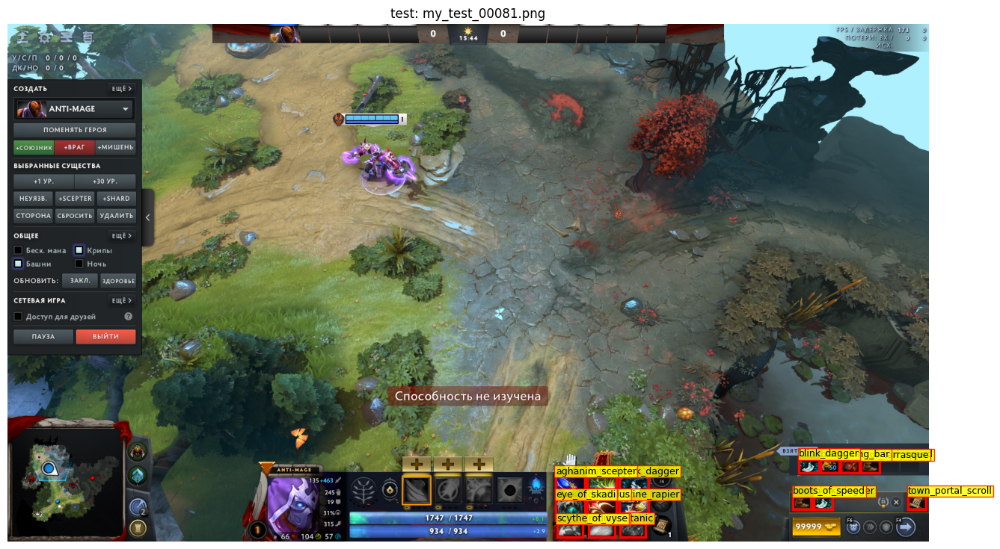

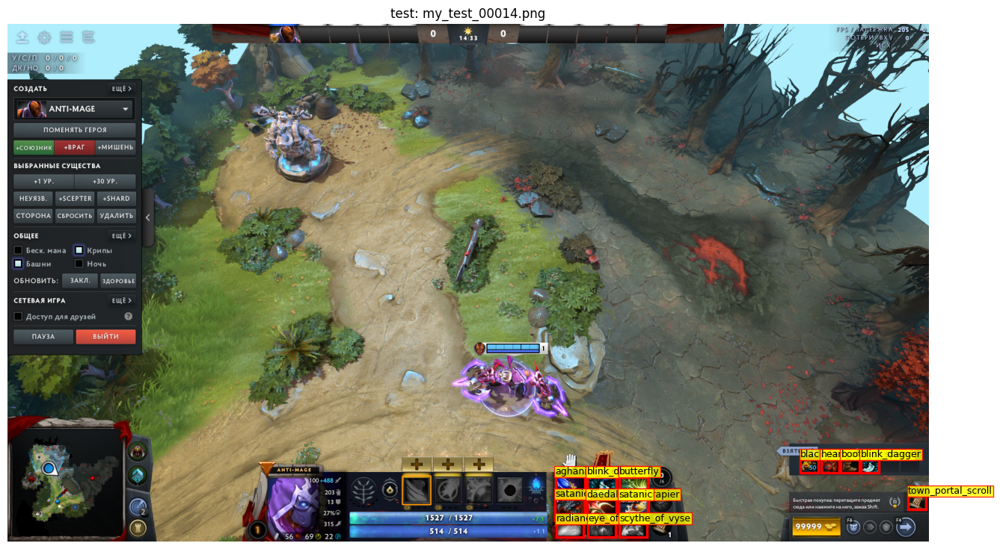

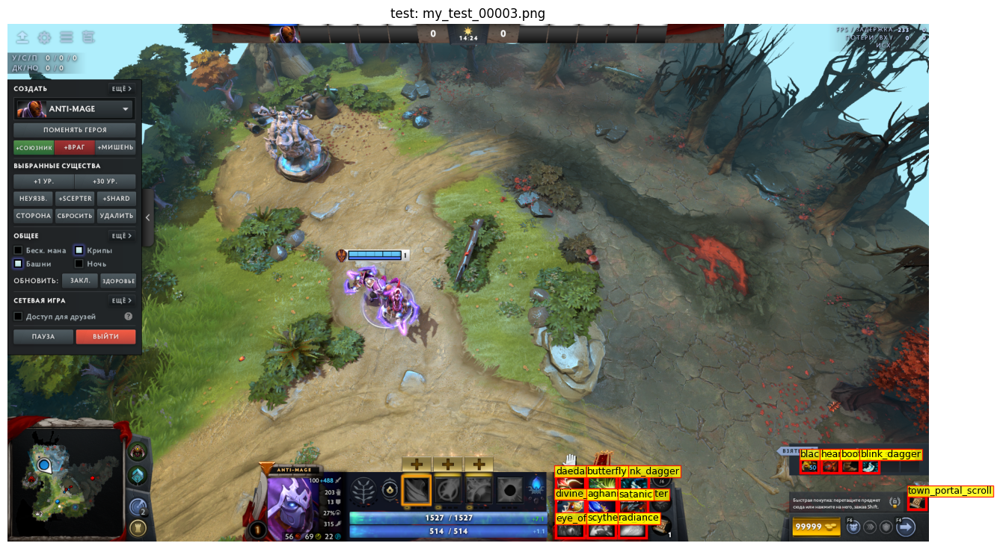

In [24]:
split = "test"
labels_dir = OUTPUT_DIR / "labels" / split

label_files = [
    path for path in labels_dir.iterdir()
    if path.suffix.lower() == ".txt"
]

random.seed(42)
sample_label_files = random.sample(label_files, 3)

for label_path in sample_label_files:
    show_labeled_image(split, label_path)

## Обучение модели YOLOv8s

После подготовки и проверки датасета можно перейти к обучению модели.

В работе используется модель `YOLOv8s`.  
Это small-версия YOLOv8, которая является компромиссом между скоростью обучения и качеством детекции.

Для обучения будет использоваться файл `data.yaml`, который был создан на предыдущих этапах.  
В нём указаны пути к обучающей, валидационной и тестовой выборкам, а также список из 13 классов предметов.

Обучение будет выполняться на итоговом датасете `dota_items_clean`.

In [25]:
from ultralytics import YOLO

In [26]:
model = YOLO("yolov8s.pt")

train_results = model.train(
    data=str(OUTPUT_DIR / "data.yaml"),
    epochs=50,
    patience=10,
    imgsz=640,
    batch=8,
    device=0,
    workers=4,
    project=str(PROJECT_DIR / "runs"),
    name="dota_items_yolov8s_b8",
)

Ultralytics 8.4.51  Python-3.11.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=dota_items_yolov8s_b8-2, nbs=64, nms=Fal

## Результаты обучения YOLOv8s

Обучение модели YOLOv8s было остановлено автоматически с помощью механизма Early Stopping.

В параметрах обучения было указано `patience=10`. Это означает, что если качество модели на валидационной выборке не улучшается в течение 10 эпох подряд, обучение завершается досрочно.

В данном случае обучение остановилось на 26-й эпохе, а лучшие веса модели были сохранены по результатам 16-й эпохи в файл `best.pt`.

Финальные метрики на валидационной выборке:

| Метрика | Значение |
|---|---:|
| Precision | 0.990 |
| Recall | 0.953 |
| mAP50 | 0.972 |
| mAP50-95 | 0.912 |

Полученные значения показывают, что модель хорошо обучилась находить и классифицировать выбранные предметы Dota 2 на валидационной выборке.

## Анализ качества по отдельным классам

Большинство классов показали высокое качество детекции. Для многих предметов значение `mAP50-95` находится выше 0.90, что говорит о хорошей точности локализации объектов.

Наиболее слабые классы на валидационной выборке:

- `blink_dagger` — `mAP50-95 = 0.626`;
- `town_portal_scroll` — `mAP50-95 = 0.767`.

Для `blink_dagger` снижение качества связано с тем, что в валидационной выборке было только 18 объектов этого класса. При таком малом количестве примеров метрика может быть нестабильной.

Для `town_portal_scroll` причина может заключаться в большом количестве объектов и разных вариантах расположения иконки в интерфейсе.

При этом финальная оценка качества будет дополнительно выполнена на собственной тестовой выборке, которая была размечена вручную в CVAT и не участвовала в обучении.

## Анализ сохранённых результатов обучения

После завершения обучения Ultralytics сохраняет результаты в папку эксперимента.

В этой папке находятся:

- график изменения loss-функций и метрик по эпохам;
- confusion matrix;
- precision-recall curve;
- F1 curve;
- веса модели `best.pt` и `last.pt`.

Для дальнейшего анализа используется модель `best.pt`, так как она соответствует лучшему качеству на валидационной выборке.

In [27]:
RUN_DIR = PROJECT_DIR / "runs" / "dota_items_yolov8s_b8"
WEIGHTS_DIR = RUN_DIR / "weights"

best_model_path = WEIGHTS_DIR / "best.pt"
last_model_path = WEIGHTS_DIR / "last.pt"

print("Папка эксперимента:")
print(RUN_DIR)

print("\nФайл best.pt существует:", best_model_path.exists())
print("Файл last.pt существует:", last_model_path.exists())

print("\nФайлы в папке эксперимента:")
for path in RUN_DIR.iterdir():
    print(" -", path.name)

Папка эксперимента:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\runs\dota_items_yolov8s_b8

Файл best.pt существует: True
Файл last.pt существует: True

Файлы в папке эксперимента:
 - args.yaml
 - BoxF1_curve.png
 - BoxPR_curve.png
 - BoxP_curve.png
 - BoxR_curve.png
 - confusion_matrix.png
 - confusion_matrix_normalized.png
 - labels.jpg
 - results.csv
 - results.png
 - train_batch0.jpg
 - train_batch1.jpg
 - train_batch2.jpg
 - val_batch0_labels.jpg
 - val_batch0_pred.jpg
 - val_batch1_labels.jpg
 - val_batch1_pred.jpg
 - val_batch2_labels.jpg
 - val_batch2_pred.jpg
 - weights


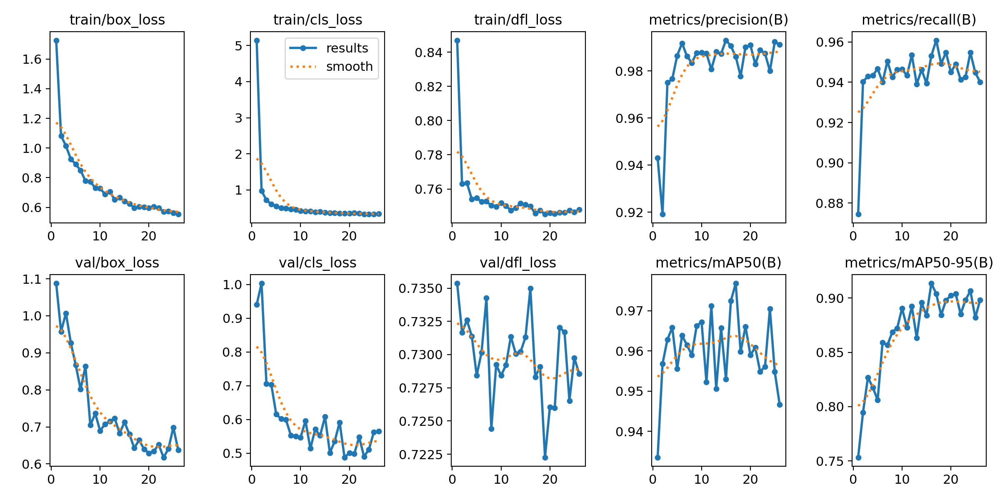

In [28]:
from IPython.display import Image as IPythonImage, display

results_png = RUN_DIR / "results.png"

display(IPythonImage(filename=str(results_png)))

## Вывод по графикам обучения

По графикам обучения можно оценить динамику изменения loss-функций и метрик качества.

Во время обучения значения `box_loss`, `cls_loss` и `dfl_loss` постепенно снижались, что говорит о том, что модель успешно обучалась локализовать объекты и определять их классы.

Метрики `precision`, `recall`, `mAP50` и `mAP50-95` быстро выросли уже на первых эпохах, после чего стабилизировались.  
Обучение было остановлено автоматически на 26-й эпохе, так как в течение 10 эпох не наблюдалось улучшения качества на валидационной выборке.

Лучшие веса модели были сохранены в файл `best.pt`.

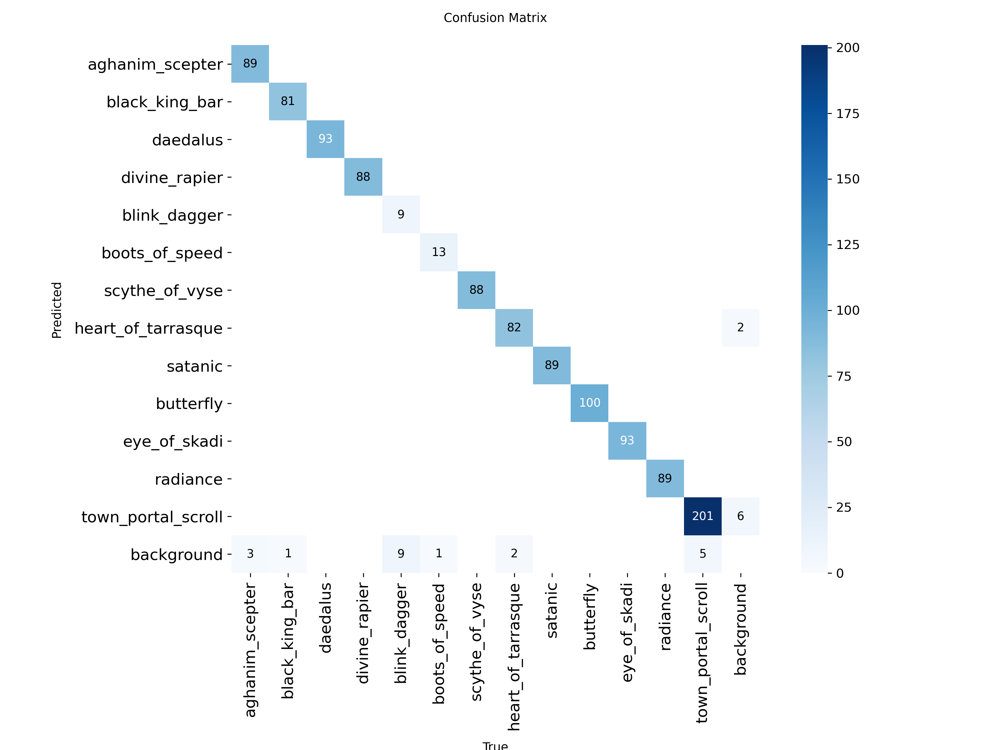

In [29]:
confusion_matrix_png = RUN_DIR / "confusion_matrix.png"

display(IPythonImage(filename=str(confusion_matrix_png)))

In [30]:
best_model_path = PROJECT_DIR / "runs" / "dota_items_yolov8s_b8" / "weights" / "best.pt"

print("Путь к лучшей модели:")
print(best_model_path)

best_model = YOLO(str(best_model_path))

test_results = best_model.val(
    data=str(OUTPUT_DIR / "data.yaml"),
    split="test",
    imgsz=640,
    batch=4,
    device=0,
)

Путь к лучшей модели:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\runs\dota_items_yolov8s_b8\weights\best.pt
Ultralytics 8.4.51  Python-3.11.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
Model summary (fused): 73 layers, 11,130,615 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access  (ping: 0.10.1 ms, read: 408.815.5 MB/s, size: 4292.7 KB)
val: Scanning C:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\labels\test... 112 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 112/112 265.7it/s 0.4s1s
val: New cache created: C:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\labels\test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 28/28 14.5it/s 1.9s0.0s
                   all        112       1736      0.322      0.361      0.316      0.218
       aghanim_scepter         96         96      0.284      0.417      0.373      0.261
        black_k

In [31]:
from ultralytics import YOLO

best_model = YOLO(str(best_model_path))

test_images_dir = OUTPUT_DIR / "images" / "test"

prediction_results = best_model.predict(
    source=str(test_images_dir),
    imgsz=640,
    conf=0.15,
    device=0,
    save=True,
    project=str(PROJECT_DIR / "runs"),
    name="test_predictions_conf015",
)


image 1/112 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test\my_test_00000.png: 384x640 1 daedalus, 2 divine_rapiers, 1 satanic, 1 butterfly, 1 town_portal_scroll, 39.3ms
image 2/112 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test\my_test_00001.png: 384x640 1 daedalus, 2 divine_rapiers, 1 satanic, 1 butterfly, 1 town_portal_scroll, 10.0ms
image 3/112 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test\my_test_00002.png: 384x640 2 divine_rapiers, 1 satanic, 1 butterfly, 1 town_portal_scroll, 10.5ms
image 4/112 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test\my_test_00003.png: 384x640 1 daedalus, 2 divine_rapiers, 1 satanic, 1 butterfly, 1 town_portal_scroll, 10.0ms
image 5/112 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_clean\images\test\my_test_00004.png: 384x640 2 divine_rapiers, 1 satanic, 1 butterfly, 1 town_porta

## Анализ ошибки на собственной тестовой выборке

После обучения модель показала высокое качество на валидационной выборке Roboflow:

| Метрика | Значение |
|---|---:|
| Precision | 0.990 |
| Recall | 0.953 |
| mAP50 | 0.972 |
| mAP50-95 | 0.912 |

Однако при проверке на собственной тестовой выборке качество оказалось значительно ниже:

| Метрика | Значение |
|---|---:|
| Precision | 0.322 |
| Recall | 0.361 |
| mAP50 | 0.316 |
| mAP50-95 | 0.218 |

Такое расхождение связано не с ошибкой обучения, а с различием между обучающими и тестовыми данными.

Основная причина — различие игрового интерфейса. В Roboflow-датасете используется другой вариант расположения HUD: миникарта, stash, quick buy и часть интерфейсных элементов расположены иначе. На собственных скриншотах интерфейс инвертирован относительно примеров Roboflow: миникарта находится слева, а области лавки, stash и quick buy находятся в других позициях.

Из-за этого модель хорошо обучилась на данных Roboflow, но хуже перенеслась на собственные изображения. Особенно заметно это для предметов, расположенных в stash/backpack/quick buy, так как в Roboflow такие области представлены иначе или недостаточно разнообразно.

Дополнительная причина — малый размер предметов на полном скриншоте. При обучении с `imgsz=640` всё изображение уменьшается, и иконки предметов становятся очень маленькими. Это усложняет локализацию объектов, особенно если предмет находится не в основной области инвентаря.

## План улучшения датасета

Для повышения качества модели необходимо уменьшить различие между обучающей и тестовой выборками.

Вместо обучения на полном скриншоте будет сформирован новый датасет с crop нижней части интерфейса.  
В этой области находятся основные объекты детекции: inventory, backpack, stash, quick buy и элементы магазина.

Также часть собственных изображений будет добавлена в обучающую и валидационную выборки. Это позволит модели увидеть нужный вариант интерфейса во время обучения.

Новая схема формирования датасета:

- `train` — очищенный Roboflow + часть собственных изображений;
- `val` — очищенный Roboflow + часть собственных изображений;
- `test` — оставшаяся часть собственных изображений.

Такой подход должен улучшить качество на собственных данных, потому что модель будет обучаться не только на Roboflow-интерфейсе, но и на скриншотах с тем вариантом HUD, который используется в тесте.

## Идея crop нижней части интерфейса

Для новой версии датасета будет использоваться не полный скриншот, а нижняя часть изображения.

Преимущества такого подхода:

- предметы становятся крупнее относительно размера изображения;
- из датасета удаляется лишняя часть карты, которая не содержит нужных объектов;
- модель фокусируется именно на интерфейсе;
- уменьшается влияние различий между игровыми сценами;
- улучшается детекция маленьких объектов.

Crop будет применяться как к Roboflow-изображениям, так и к собственным изображениям.  
После crop координаты bounding boxes будут пересчитаны в новый формат YOLO.

In [32]:
CROP_OUTPUT_DIR = PROJECT_DIR / "data" / "dota_items_crop"

CROP_X_MIN = 0.0
CROP_Y_MIN = 0.50
CROP_X_MAX = 1.0
CROP_Y_MAX = 1.0

MY_TRAIN_COUNT = 72
MY_VAL_COUNT = 16
MY_TEST_COUNT = 24

print("Папка crop-датасета:")
print(CROP_OUTPUT_DIR)

print("\nГраницы crop:")
print("x_min:", CROP_X_MIN)
print("y_min:", CROP_Y_MIN)
print("x_max:", CROP_X_MAX)
print("y_max:", CROP_Y_MAX)

print("\nРазделение собственных изображений:")
print("train:", MY_TRAIN_COUNT)
print("val:", MY_VAL_COUNT)
print("test:", MY_TEST_COUNT)

Папка crop-датасета:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop

Границы crop:
x_min: 0.0
y_min: 0.5
x_max: 1.0
y_max: 1.0

Разделение собственных изображений:
train: 72
val: 16
test: 24


In [33]:
def convert_bbox_to_crop(
    class_id: int,
    x_center: float,
    y_center: float,
    width: float,
    height: float,
    crop_x_min: float,
    crop_y_min: float,
    crop_x_max: float,
    crop_y_max: float,
) -> list[float] | None:
    """
    Преобразует YOLO bbox из координат полного изображения
    в координаты crop-изображения.
    """
    x_min = x_center - width / 2
    y_min = y_center - height / 2
    x_max = x_center + width / 2
    y_max = y_center + height / 2

    clipped_x_min = max(x_min, crop_x_min)
    clipped_y_min = max(y_min, crop_y_min)
    clipped_x_max = min(x_max, crop_x_max)
    clipped_y_max = min(y_max, crop_y_max)

    if clipped_x_max <= clipped_x_min or clipped_y_max <= clipped_y_min:
        return None

    crop_width = crop_x_max - crop_x_min
    crop_height = crop_y_max - crop_y_min

    new_x_min = (clipped_x_min - crop_x_min) / crop_width
    new_y_min = (clipped_y_min - crop_y_min) / crop_height
    new_x_max = (clipped_x_max - crop_x_min) / crop_width
    new_y_max = (clipped_y_max - crop_y_min) / crop_height

    new_x_center = (new_x_min + new_x_max) / 2
    new_y_center = (new_y_min + new_y_max) / 2
    new_width = new_x_max - new_x_min
    new_height = new_y_max - new_y_min

    return [
        class_id,
        new_x_center,
        new_y_center,
        new_width,
        new_height,
    ]

In [34]:
def crop_image_and_labels(
    image_path: Path,
    label_path: Path,
    output_image_path: Path,
    output_label_path: Path,
) -> int:
    """
    Обрезает изображение и пересчитывает YOLO-разметку
    под новую crop-область.
    """
    image = Image.open(image_path).convert("RGB")
    image_width, image_height = image.size

    left = int(CROP_X_MIN * image_width)
    top = int(CROP_Y_MIN * image_height)
    right = int(CROP_X_MAX * image_width)
    bottom = int(CROP_Y_MAX * image_height)

    cropped_image = image.crop((left, top, right, bottom))

    new_lines = []

    for line in label_path.read_text(encoding="utf-8").splitlines():
        parts = line.strip().split()

        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        converted_bbox = convert_bbox_to_crop(
            class_id=class_id,
            x_center=x_center,
            y_center=y_center,
            width=width,
            height=height,
            crop_x_min=CROP_X_MIN,
            crop_y_min=CROP_Y_MIN,
            crop_x_max=CROP_X_MAX,
            crop_y_max=CROP_Y_MAX,
        )

        if converted_bbox is not None:
            new_class_id, new_x_center, new_y_center, new_width, new_height = converted_bbox

            new_lines.append(
                f"{new_class_id} {new_x_center:.6f} {new_y_center:.6f} {new_width:.6f} {new_height:.6f}"
            )

    if len(new_lines) > 0:
        cropped_image.save(output_image_path)
        output_label_path.write_text("\n".join(new_lines) + "\n", encoding="utf-8")

    return len(new_lines)

## Контроль дубликатов при разделении данных

При формировании нового crop-датасета важно не допустить утечки данных между обучающей и тестовой выборками.

Если одно и то же изображение или почти одинаковые изображения попадут одновременно в `train` и `test`, метрики тестирования могут быть завышены. В таком случае модель фактически уже видела похожий пример во время обучения.

Для предотвращения такой проблемы будут использованы два подхода:

1. Полные дубликаты изображений будут определяться по хэшу файла.
2. Собственные изображения будут разделяться не случайно по отдельным кадрам, а в исходном порядке, так как похожие изображения обычно идут рядом сериями.

В новой версии датасета собственные изображения будут разделены так:

- первые 80 изображений — `train`;
- следующие 16 изображений — `val`;
- последние 16 изображений — `test`.

Такой вариант уменьшает вероятность попадания почти одинаковых кадров в разные части датасета.

In [35]:
import hashlib


def calculate_file_hash(file_path: Path) -> str:
    """
    Вычисляет MD5-хэш файла.
    """
    file_bytes = file_path.read_bytes()
    file_hash = hashlib.md5(file_bytes).hexdigest()

    return file_hash


def collect_image_files(images_dir: Path) -> list[Path]:
    """
    Собирает изображения из указанной папки.
    """
    image_files = [
        path
        for path in images_dir.iterdir()
        if path.suffix.lower() in IMAGE_EXTENSIONS
    ]

    image_files = sorted(image_files)

    return image_files

In [36]:
my_image_files = collect_image_files(MY_IMAGES_DIR)

my_hashes = [
    calculate_file_hash(image_path)
    for image_path in my_image_files
]

unique_hashes = set(my_hashes)

print("Собственных изображений всего:", len(my_image_files))
print("Уникальных изображений по хэшу:", len(unique_hashes))
print("Полных дубликатов:", len(my_image_files) - len(unique_hashes))

Собственных изображений всего: 112
Уникальных изображений по хэшу: 112
Полных дубликатов: 0


In [37]:
import shutil

if CROP_OUTPUT_DIR.exists():
    shutil.rmtree(CROP_OUTPUT_DIR)

for split in ["train", "val", "test"]:
    (CROP_OUTPUT_DIR / "images" / split).mkdir(parents=True, exist_ok=True)
    (CROP_OUTPUT_DIR / "labels" / split).mkdir(parents=True, exist_ok=True)

print("Создана структура crop-датасета:")
print(CROP_OUTPUT_DIR)

for split in ["train", "val", "test"]:
    print(" -", CROP_OUTPUT_DIR / "images" / split)
    print(" -", CROP_OUTPUT_DIR / "labels" / split)

Создана структура crop-датасета:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\images\train
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\labels\train
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\images\val
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\labels\val
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\images\test
 - c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop\labels\test


In [38]:
def add_crop_sample(
    source_image_path: Path,
    source_label_path: Path,
    target_split: str,
    new_stem: str,
) -> int:
    """
    Добавляет одно изображение в crop-датасет.

    Изображение обрезается по заданной crop-области, а YOLO-разметка
    пересчитывается под новые размеры изображения.
    """
    output_image_path = (
        CROP_OUTPUT_DIR
        / "images"
        / target_split
        / f"{new_stem}{source_image_path.suffix.lower()}"
    )

    output_label_path = (
        CROP_OUTPUT_DIR
        / "labels"
        / target_split
        / f"{new_stem}.txt"
    )

    objects_count = crop_image_and_labels(
        image_path=source_image_path,
        label_path=source_label_path,
        output_image_path=output_image_path,
        output_label_path=output_label_path,
    )

    return objects_count

In [39]:
copied_roboflow_train = 0
copied_roboflow_val = 0

for split in ["train", "val"]:
    source_images_dir = OUTPUT_DIR / "images" / split
    source_labels_dir = OUTPUT_DIR / "labels" / split

    label_files = sorted([
        path for path in source_labels_dir.iterdir()
        if path.suffix.lower() == ".txt"
    ])

    for label_index, label_path in enumerate(label_files):
        image_path = find_image_by_label_path(split, label_path)

        new_stem = f"rf_crop_{split}_{label_index:05d}"

        objects_count = add_crop_sample(
            source_image_path=image_path,
            source_label_path=label_path,
            target_split=split,
            new_stem=new_stem,
        )

        if objects_count > 0:
            if split == "train":
                copied_roboflow_train += 1
            else:
                copied_roboflow_val += 1

print("Roboflow после crop:")
print("train:", copied_roboflow_train)
print("val:", copied_roboflow_val)

Roboflow после crop:
train: 1568
val: 229


## Добавление собственных изображений в crop-датасет

На предыдущем этапе в crop-датасет были добавлены очищенные изображения Roboflow.

Теперь в датасет добавляются собственные изображения, размеченные вручную в CVAT.  
В отличие от первой версии эксперимента, собственные изображения больше не используются только для тестирования.

Они будут разделены на три части:

- 80 изображений — в обучающую выборку;
- 16 изображений — в валидационную выборку;
- 16 изображений — в тестовую выборку.

Такой подход позволяет модели во время обучения увидеть нужный вариант интерфейса Dota 2, включая расположение inventory, backpack, stash и quick buy.

In [40]:
my_label_files = sorted([
    path for path in MY_LABELS_DIR.iterdir()
    if path.suffix.lower() == ".txt"
])

my_train_labels = my_label_files[:MY_TRAIN_COUNT]
my_val_labels = my_label_files[MY_TRAIN_COUNT:MY_TRAIN_COUNT + MY_VAL_COUNT]
my_test_labels = my_label_files[MY_TRAIN_COUNT + MY_VAL_COUNT:MY_TRAIN_COUNT + MY_VAL_COUNT + MY_TEST_COUNT]

print("Разделение собственных изображений:")
print("train:", len(my_train_labels))
print("val:", len(my_val_labels))
print("test:", len(my_test_labels))

Разделение собственных изображений:
train: 72
val: 16
test: 24


In [41]:
def copy_my_crop_split(label_files: list[Path], target_split: str) -> int:
    """
    Добавляет часть собственного CVAT-датасета в crop-датасет.
    """
    copied_count = 0

    for label_index, label_path in enumerate(label_files):
        image_path = find_image_by_stem(MY_IMAGES_DIR, label_path.stem)

        new_stem = f"my_crop_{target_split}_{label_index:05d}"

        objects_count = add_crop_sample(
            source_image_path=image_path,
            source_label_path=label_path,
            target_split=target_split,
            new_stem=new_stem,
        )

        if objects_count > 0:
            copied_count += 1

    return copied_count


my_train_copied = copy_my_crop_split(my_train_labels, "train")
my_val_copied = copy_my_crop_split(my_val_labels, "val")
my_test_copied = copy_my_crop_split(my_test_labels, "test")

print("Собственные изображения после crop:")
print("train:", my_train_copied)
print("val:", my_val_copied)
print("test:", my_test_copied)

Собственные изображения после crop:
train: 72
val: 16
test: 24


In [42]:
print("Итоговая структура crop-датасета:")

for split in ["train", "val", "test"]:
    images_dir = CROP_OUTPUT_DIR / "images" / split
    labels_dir = CROP_OUTPUT_DIR / "labels" / split

    images_count = count_images(images_dir)
    labels_count = count_labels(labels_dir)

    print(f"{split:5s}: images = {images_count:4d}, labels = {labels_count:4d}")

Итоговая структура crop-датасета:
train: images = 1640, labels = 1640
val  : images =  245, labels =  245
test : images =   24, labels =   24


In [43]:
from collections import Counter


def count_objects_by_class(labels_dir: Path) -> Counter:
    """
    Подсчитывает количество объектов каждого класса в папке с YOLO-разметкой.
    """
    object_counts = Counter()

    for label_path in labels_dir.iterdir():
        if label_path.suffix.lower() != ".txt":
            continue

        lines = label_path.read_text(encoding="utf-8").splitlines()

        for line in lines:
            parts = line.strip().split()
            class_id = int(parts[0])
            object_counts[class_id] += 1

    return object_counts

In [44]:
crop_split_object_counts = {
    split: count_objects_by_class(CROP_OUTPUT_DIR / "labels" / split)
    for split in ["train", "val", "test"]
}

crop_objects_distribution = pd.DataFrame(
    [
        {
            "class_id": class_id,
            "class_name": class_name,
            "train": crop_split_object_counts["train"][class_id],
            "val": crop_split_object_counts["val"][class_id],
            "test": crop_split_object_counts["test"][class_id],
            "total": (
                crop_split_object_counts["train"][class_id]
                + crop_split_object_counts["val"][class_id]
                + crop_split_object_counts["test"][class_id]
            ),
        }
        for class_id, class_name in enumerate(FINAL_NAMES)
    ]
)

crop_objects_distribution

,class_id,class_name,train,val,test,total
0,0,aghanim_scepter,122,27,8,157
1,1,black_king_bar,152,19,0,171
2,2,daedalus,661,109,96,866
3,3,divine_rapier,713,104,8,825
4,4,blink_dagger,200,57,64,321
5,5,boots_of_speed,175,37,40,252
6,6,scythe_of_vyse,121,23,24,168
7,7,heart_of_tarrasque,128,23,24,175
8,8,satanic,662,105,24,791
9,9,butterfly,676,116,24,816


## Анализ первого crop-разбиения

После применения crop нижней части интерфейса был сформирован промежуточный вариант датасета.  
Цель этого этапа заключалась не в финальном обучении, а в проверке идеи: сохраняются ли объекты после обрезки изображения и корректно ли пересчитываются bounding boxes.

После подсчёта объектов по классам было обнаружено, что первичное разбиение получилось несбалансированным.  
Например, класс `black_king_bar` не попал в тестовую выборку, а классы `aghanim_scepter` и `divine_rapier` были представлены в `test` малым количеством объектов.

Это означает, что такой split нельзя использовать как финальный: модель не сможет быть корректно оценена по тем классам, которые отсутствуют или почти отсутствуют в тестовой выборке.

Кроме того, в задании указано ограничение на размер датасетов:

- обучающий датасет: от 150 до 500 примеров;
- тестовый датасет: от 50 до 100 примеров.

Поэтому после промежуточной проверки было принято решение сформировать финальную crop-версию датасета с контролируемым количеством изображений.

## Формирование финального crop-датасета

Для финального эксперимента формируется новый датасет `dota_items_crop_final`.

При его формировании учитываются три требования:

1. **Соответствие условию лабораторной работы**  
   Обучающая выборка должна содержать от 150 до 500 изображений, а тестовая — от 50 до 100 изображений.

2. **Уменьшение domain shift**  
   В первой версии модель обучалась только на Roboflow-изображениях и плохо работала на собственных скриншотах.  
   Поэтому часть собственных изображений добавляется в обучающую и валидационную выборки.

3. **Честная тестовая выборка**  
   Тестовая выборка состоит только из собственных изображений, которые не используются при обучении.  
   Это позволяет проверить работу модели именно на пользовательском варианте интерфейса Dota 2.

Финальное разбиение:

| Часть датасета | Источник | Количество изображений |
|---|---|---:|
| train | Roboflow crop | 350 |
| train | собственные crop-изображения | 50 |
| val | Roboflow crop | 70 |
| val | собственные crop-изображения | 12 |
| test | собственные crop-изображения | 50 |

Итог:

| Часть датасета | Количество изображений |
|---|---:|
| train | 400 |
| val | 82 |
| test | 50 |

Такой вариант соответствует заданию и при этом позволяет модели обучаться не только на Roboflow-данных, но и на собственном варианте интерфейса.

In [48]:
CROP_OUTPUT_DIR = PROJECT_DIR / "data" / "dota_items_crop_final"

ROBOFLOW_TRAIN_LIMIT = 350
ROBOFLOW_VAL_LIMIT = 70

MY_TRAIN_COUNT = 50
MY_VAL_COUNT = 12
MY_TEST_COUNT = 50

In [49]:
if CROP_OUTPUT_DIR.exists():
    shutil.rmtree(CROP_OUTPUT_DIR)

for split in ["train", "val", "test"]:
    (CROP_OUTPUT_DIR / "images" / split).mkdir(parents=True, exist_ok=True)
    (CROP_OUTPUT_DIR / "labels" / split).mkdir(parents=True, exist_ok=True)

print("Создана структура папок для финального crop-датасета:")

for split in ["train", "val", "test"]:
    print(CROP_OUTPUT_DIR / "images" / split)
    print(CROP_OUTPUT_DIR / "labels" / split)

Создана структура папок для финального crop-датасета:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\train
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\labels\train
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\val
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\labels\val
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\test
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\labels\test


In [46]:
my_label_files = sorted([
    path for path in MY_LABELS_DIR.iterdir()
    if path.suffix.lower() == ".txt"
])

my_train_labels = my_label_files[:MY_TRAIN_COUNT]
my_val_labels = my_label_files[MY_TRAIN_COUNT:MY_TRAIN_COUNT + MY_VAL_COUNT]
my_test_labels = my_label_files[MY_TRAIN_COUNT + MY_VAL_COUNT:MY_TRAIN_COUNT + MY_VAL_COUNT + MY_TEST_COUNT]

print("Собственные изображения:")
print("train:", len(my_train_labels))
print("val:", len(my_val_labels))
print("test:", len(my_test_labels))

Собственные изображения:
train: 50
val: 12
test: 50


In [50]:
my_train_copied = copy_my_crop_split(my_train_labels, "train")
my_val_copied = copy_my_crop_split(my_val_labels, "val")
my_test_copied = copy_my_crop_split(my_test_labels, "test")

print("Добавлено собственных crop-изображений:")
print("train:", my_train_copied)
print("val:", my_val_copied)
print("test:", my_test_copied)

Добавлено собственных crop-изображений:
train: 50
val: 12
test: 50


In [52]:
def copy_limited_roboflow_crop(source_split: str, target_split: str, limit: int) -> int:
    """
    Копирует ограниченное количество изображений Roboflow в финальный crop-датасет.

    Изображения берутся из уже очищенного датасета OUTPUT_DIR,
    затем обрезаются по нижней части интерфейса и сохраняются
    в CROP_OUTPUT_DIR.
    """
    source_images_dir = OUTPUT_DIR / "images" / source_split
    source_labels_dir = OUTPUT_DIR / "labels" / source_split

    label_files = sorted([
        path for path in source_labels_dir.iterdir()
        if path.suffix.lower() == ".txt"
    ])

    copied_count = 0

    for label_path in label_files:
        if copied_count >= limit:
            break

        image_path = find_image_by_stem(source_images_dir, label_path.stem)

        new_stem = f"rf_crop_{target_split}_{copied_count:05d}"

        objects_count = add_crop_sample(
            source_image_path=image_path,
            source_label_path=label_path,
            target_split=target_split,
            new_stem=new_stem,
        )

        if objects_count > 0:
            copied_count += 1

    return copied_count

In [53]:
roboflow_train_copied = copy_limited_roboflow_crop(
    source_split="train",
    target_split="train",
    limit=ROBOFLOW_TRAIN_LIMIT,
)

roboflow_val_copied = copy_limited_roboflow_crop(
    source_split="val",
    target_split="val",
    limit=ROBOFLOW_VAL_LIMIT,
)

print("Добавлено Roboflow-изображений:")
print("train:", roboflow_train_copied)
print("val:", roboflow_val_copied)

Добавлено Roboflow-изображений:
train: 350
val: 70


## Проверка финального crop-датасета

После добавления Roboflow-изображений и собственных изображений необходимо проверить итоговую структуру датасета.

Ожидаемая структура:

- `train`: 400 изображений;
- `val`: 82 изображения;
- `test`: 50 изображений.

Также необходимо убедиться, что количество изображений совпадает с количеством файлов разметки. Для YOLO-датасета это важно, так как каждому изображению должен соответствовать `.txt`-файл с bounding boxes.

In [54]:
print("Итоговая структура dota_items_crop_final:")

for split in ["train", "val", "test"]:
    images_count = count_images(CROP_OUTPUT_DIR / "images" / split)
    labels_count = count_labels(CROP_OUTPUT_DIR / "labels" / split)

    print(f"{split:5s}: images = {images_count:4d}, labels = {labels_count:4d}")

Итоговая структура dota_items_crop_final:
train: images =  400, labels =  400
val  : images =   82, labels =   82
test : images =   50, labels =   50


In [55]:
crop_final_data_yaml_text = f"""path: {CROP_OUTPUT_DIR.resolve().as_posix()}
train: images/train
val: images/val
test: images/test

nc: {len(FINAL_NAMES)}

names:
"""

for class_id, class_name in enumerate(FINAL_NAMES):
    crop_final_data_yaml_text += f"  {class_id}: {class_name}\n"

crop_final_data_yaml_path = CROP_OUTPUT_DIR / "data.yaml"
crop_final_data_yaml_path.write_text(crop_final_data_yaml_text, encoding="utf-8")

print("Создан data.yaml:")
print(crop_final_data_yaml_path)

print("\nСодержимое data.yaml:")
print(crop_final_data_yaml_text)

Создан data.yaml:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\data.yaml

Содержимое data.yaml:
path: C:/Users/motyn/Desktop/repositories/_OMSTU/CV/lab_7/data/dota_items_crop_final
train: images/train
val: images/val
test: images/test

nc: 13

names:
  0: aghanim_scepter
  1: black_king_bar
  2: daedalus
  3: divine_rapier
  4: blink_dagger
  5: boots_of_speed
  6: scythe_of_vyse
  7: heart_of_tarrasque
  8: satanic
  9: butterfly
  10: eye_of_skadi
  11: radiance
  12: town_portal_scroll



## Проверка распределения классов

После формирования датасета нужно проверить количество объектов каждого класса в `train`, `val` и `test`.

Это особенно важно для тестовой выборки: если какой-то класс отсутствует в `test`, то оценить качество модели по этому классу будет невозможно.

Далее выполняется подсчёт количества bbox-разметок по каждому классу.

In [56]:
crop_final_split_object_counts = {
    split: count_objects_by_class(CROP_OUTPUT_DIR / "labels" / split)
    for split in ["train", "val", "test"]
}

crop_final_objects_distribution = pd.DataFrame(
    [
        {
            "class_id": class_id,
            "class_name": class_name,
            "train": crop_final_split_object_counts["train"][class_id],
            "val": crop_final_split_object_counts["val"][class_id],
            "test": crop_final_split_object_counts["test"][class_id],
            "total": (
                crop_final_split_object_counts["train"][class_id]
                + crop_final_split_object_counts["val"][class_id]
                + crop_final_split_object_counts["test"][class_id]
            ),
        }
        for class_id, class_name in enumerate(FINAL_NAMES)
    ]
)

crop_final_objects_distribution

,class_id,class_name,train,val,test,total
0,0,aghanim_scepter,50,12,34,96
1,1,black_king_bar,116,15,26,157
2,2,daedalus,50,12,122,184
3,3,divine_rapier,50,16,34,100
4,4,blink_dagger,118,36,142,296
5,5,boots_of_speed,113,27,92,232
6,6,scythe_of_vyse,50,12,50,112
7,7,heart_of_tarrasque,81,17,50,148
8,8,satanic,58,12,50,120
9,9,butterfly,50,19,50,119


In [57]:
print("Общее количество объектов в финальном crop-датасете:")

for split in ["train", "val", "test"]:
    total_objects = sum(crop_final_split_object_counts[split].values())
    min_objects = min(
        crop_final_split_object_counts[split][class_id]
        for class_id in range(len(FINAL_NAMES))
    )
    max_objects = max(
        crop_final_split_object_counts[split][class_id]
        for class_id in range(len(FINAL_NAMES))
    )

    print(f"{split:5s}: total = {total_objects:5d}, min = {min_objects:4d}, max = {max_objects:4d}")

Общее количество объектов в финальном crop-датасете:
train: total =  1125, min =   50, max =  289
val  : total =   271, min =   12, max =   57
test : total =   800, min =   26, max =  142


## Вывод по распределению объектов в финальном crop-датасете

После формирования финальной версии `dota_items_crop_final` было проверено распределение объектов по классам в частях `train`, `val` и `test`.

Итоговое количество объектов:

| Часть датасета | Количество объектов | Минимум по классу | Максимум по классу |
|---|---:|---:|---:|
| train | 1125 | 50 | 289 |
| val | 271 | 12 | 57 |
| test | 800 | 26 | 142 |

В отличие от промежуточного crop-разбиения, в финальной тестовой выборке нет классов с нулевым количеством объектов.  
Это означает, что каждый из 13 предметов представлен в `test` и может быть оценён после обучения модели.

Распределение объектов не является полностью равномерным, однако для лабораторной работы оно является приемлемым: каждый класс имеет достаточное количество объектов в обучающей и тестовой выборках.

Финальный датасет соответствует условию задания:

- обучающая выборка содержит 400 изображений;
- тестовая выборка содержит 50 изображений;
- используется 13 классов игровых предметов Dota 2.

## Визуальная проверка финального crop-датасета

Перед повторным обучением модели необходимо визуально проверить несколько изображений из финального crop-датасета.

Цель проверки:

- убедиться, что изображения действительно обрезаны по нижней части интерфейса;
- проверить, что bounding boxes корректно пересчитались после crop;
- убедиться, что подписи классов соответствуют предметам;
- проверить, что объекты не были случайно обрезаны.

In [58]:
def find_crop_image_by_label_path(split: str, label_path: Path) -> Path:
    images_dir = CROP_OUTPUT_DIR / "images" / split

    candidates = [
        path
        for path in images_dir.iterdir()
        if path.stem == label_path.stem and path.suffix.lower() in IMAGE_EXTENSIONS
    ]

    return candidates[0]

In [59]:
def show_crop_labeled_image(split: str, label_path: Path) -> None:
    image_path = find_crop_image_by_label_path(split, label_path)
    image = Image.open(image_path).convert("RGB")

    image_width, image_height = image.size
    labels = read_yolo_labels(label_path)

    fig, ax = plt.subplots(figsize=(16, 8))
    ax.imshow(image)
    ax.axis("off")
    ax.set_title(f"{split}: {image_path.name}")

    for class_id, x_center, y_center, width, height in labels:
        x_min, y_min, x_max, y_max = yolo_to_xyxy(
            x_center=x_center,
            y_center=y_center,
            width=width,
            height=height,
            image_width=image_width,
            image_height=image_height,
        )

        rectangle = patches.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            fill=False,
            edgecolor="red",
            linewidth=2.5,
        )

        ax.add_patch(rectangle)

        ax.text(
            x_min,
            y_min - 4,
            FINAL_NAMES[class_id],
            fontsize=9,
            color="black",
            bbox={
                "facecolor": "yellow",
                "edgecolor": "red",
                "alpha": 0.8,
                "pad": 1,
            },
        )

    plt.show()

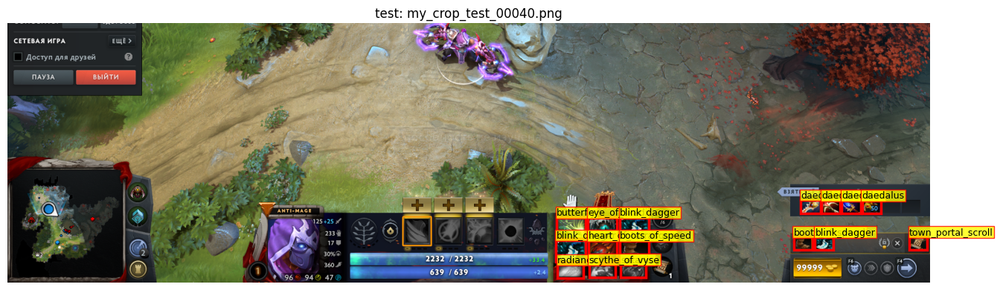

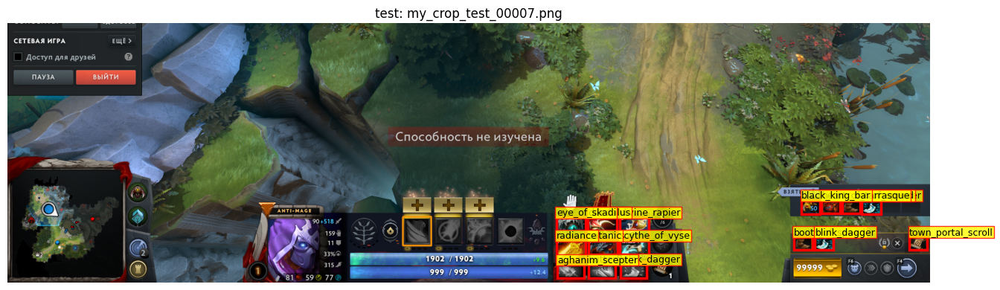

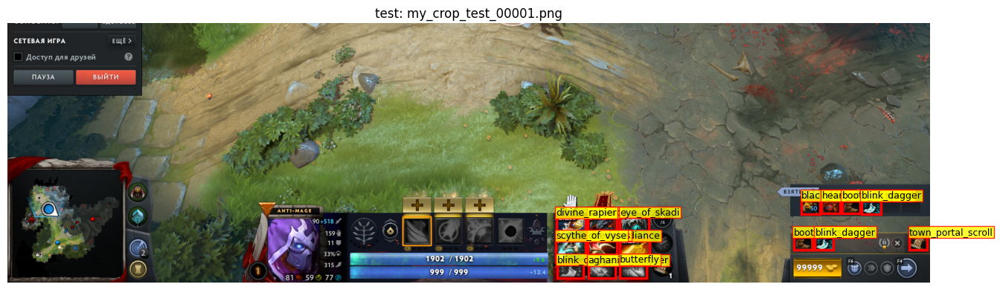

In [60]:
split = "test"
labels_dir = CROP_OUTPUT_DIR / "labels" / split

label_files = sorted([
    path for path in labels_dir.iterdir()
    if path.suffix.lower() == ".txt"
])

random.seed(42)
sample_label_files = random.sample(label_files, 3)

for label_path in sample_label_files:
    show_crop_labeled_image(split, label_path)

## Вывод по визуальной проверке

Визуальная проверка показала, что финальный crop-датасет сформирован корректно.

Изображения содержат нижнюю часть интерфейса Dota 2, где находятся предметы, inventory, backpack, stash и quick buy.  
Bounding boxes расположены вокруг иконок предметов, а подписи классов соответствуют размеченным объектам.

Это подтверждает, что после crop координаты разметки были пересчитаны правильно.  
Финальный датасет `dota_items_crop_final` можно использовать для повторного обучения модели YOLOv8s.

In [61]:
data=str(CROP_OUTPUT_DIR / "data.yaml")

## Повторное обучение YOLOv8s на финальном crop-датасете

Для второго эксперимента используется финальная версия датасета `dota_items_crop_final`.

Отличия от первого эксперимента:

- изображения обрезаны по нижней части интерфейса;
- часть собственных изображений добавлена в `train` и `val`;
- тестовая выборка состоит только из собственных изображений;
- размер обучающего и тестового датасетов соответствует условию лабораторной работы.

Ожидается, что такая подготовка данных уменьшит domain shift и улучшит качество модели на собственных скриншотах.

In [65]:
crop_model = YOLO("yolov8s.pt")

crop_train_results = crop_model.train(
    data=str(CROP_OUTPUT_DIR / "data.yaml"),
    epochs=50,
    patience=10,
    imgsz=640,
    batch=8,
    device=0,
    workers=4,
    project=str(PROJECT_DIR / "runs"),
    name="dota_items_yolov8s_crop_final",
)

Ultralytics 8.4.51  Python-3.11.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=dota_items_yolov8s_crop_final, nbs=

## Результаты повторного обучения на финальном crop-датасете

Вторая модель была обучена на финальной crop-версии датасета `dota_items_crop_final`.

В отличие от первого эксперимента, обучающая выборка была ограничена 400 изображениями, а валидационная выборка включала часть собственных изображений. Поэтому оценка качества стала более честной по отношению к пользовательскому варианту интерфейса Dota 2.

Финальные метрики на валидационной выборке:

| Метрика | Значение |
|---|---:|
| Precision | 0.765 |
| Recall | 0.842 |
| mAP50 | 0.890 |
| mAP50-95 | 0.804 |

По сравнению с первым экспериментом метрики на валидации стали ниже, однако это объясняется тем, что новая валидационная выборка сложнее и ближе к собственным данным. При этом значение `mAP50-95 = 0.804` показывает, что модель достаточно хорошо научилась находить выбранные предметы в crop-области интерфейса.

Наиболее высокое качество показали классы `satanic`, `heart_of_tarrasque`, `daedalus`, `blink_dagger`, `scythe_of_vyse` и `black_king_bar`.

Наиболее слабым классом оказался `butterfly`, для которого значение `mAP50-95` составило 0.504. Это может быть связано с малым количеством объектов данного класса в валидационной выборке и визуальной схожестью некоторых иконок.

In [66]:
crop_best_model_path = PROJECT_DIR / "runs" / "dota_items_yolov8s_crop_final" / "weights" / "best.pt"

print("Путь к лучшей crop-модели:")
print(crop_best_model_path)

crop_best_model = YOLO(str(crop_best_model_path))

crop_test_results = crop_best_model.val(
    data=str(CROP_OUTPUT_DIR / "data.yaml"),
    split="test",
    imgsz=640,
    batch=4,
    device=0,
    workers=2,
    plots=True,
)

Путь к лучшей crop-модели:
c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\runs\dota_items_yolov8s_crop_final\weights\best.pt
Ultralytics 8.4.51  Python-3.11.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
Model summary (fused): 73 layers, 11,130,615 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 165.017.4 MB/s, size: 1645.2 KB)
val: Scanning C:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\labels\test... 50 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 50/50 547.8it/s 0.1s
val: New cache created: C:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\labels\test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 2.9it/s 4.5s<0.2s
                   all         50        800      0.767      0.722      0.794      0.709
       aghanim_scepter         34         34      0.561      0.706      0.792      0.6

## Проверка второй модели на тестовой выборке

После повторного обучения модель была проверена на финальной тестовой выборке.  
Тестовая выборка содержит 50 собственных crop-изображений, которые не использовались при обучении.

Результаты на тестовой выборке:

| Метрика | Значение |
|---|---:|
| Precision | 0.767 |
| Recall | 0.722 |
| mAP50 | 0.794 |
| mAP50-95 | 0.709 |

По сравнению с первой моделью качество на собственных изображениях значительно выросло.

Первая модель, обученная только на Roboflow-данных, показала на собственном тесте:

| Метрика | Значение |
|---|---:|
| Precision | 0.322 |
| Recall | 0.361 |
| mAP50 | 0.316 |
| mAP50-95 | 0.218 |

После применения crop нижней части интерфейса и добавления части собственных изображений в обучающую выборку качество заметно улучшилось:

| Метрика | Первая модель | Вторая модель |
|---|---:|---:|
| Precision | 0.322 | 0.767 |
| Recall | 0.361 | 0.722 |
| mAP50 | 0.316 | 0.794 |
| mAP50-95 | 0.218 | 0.709 |

Таким образом, доработка датасета позволила существенно уменьшить влияние domain shift и повысить качество модели на пользовательском варианте интерфейса Dota 2.

## Анализ результатов по классам

На тестовой выборке лучше всего модель определяет следующие классы:

- `town_portal_scroll`: `mAP50-95 = 0.929`;
- `divine_rapier`: `mAP50-95 = 0.901`;
- `butterfly`: `mAP50-95 = 0.886`;
- `blink_dagger`: `mAP50-95 = 0.809`;
- `radiance`: `mAP50-95 = 0.803`;
- `heart_of_tarrasque`: `mAP50-95 = 0.793`;
- `boots_of_speed`: `mAP50-95 = 0.770`;
- `eye_of_skadi`: `mAP50-95 = 0.772`.

Наиболее слабые классы:

- `satanic`: `mAP50-95 = 0.176`;
- `daedalus`: `mAP50-95 = 0.321`.

Для этих классов модель часто пропускает объекты или путает их с другими предметами. Возможная причина — визуальная схожесть иконок, малый размер объектов, а также недостаточное разнообразие собственных примеров в обучающей выборке.

Тем не менее, общие метрики второй модели значительно выше, чем у первой модели на собственном тесте. Это подтверждает эффективность выбранного улучшения датасета.

In [67]:
crop_prediction_results = crop_best_model.predict(
    source=str(CROP_OUTPUT_DIR / "images" / "test"),
    imgsz=640,
    conf=0.25,
    device=0,
    save=True,
    project=str(PROJECT_DIR / "runs"),
    name="crop_final_test_predictions",
)


image 1/50 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\test\my_crop_test_00000.png: 192x640 1 aghanim_scepter, 1 black_king_bar, 1 daedalus, 2 divine_rapiers, 3 blink_daggers, 2 boots_of_speeds, 1 scythe_of_vyse, 1 heart_of_tarrasque, 1 satanic, 1 eye_of_skadi, 1 radiance, 1 town_portal_scroll, 57.0ms
image 2/50 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\test\my_crop_test_00001.png: 192x640 1 aghanim_scepter, 1 black_king_bar, 1 daedalus, 2 divine_rapiers, 3 blink_daggers, 2 boots_of_speeds, 1 scythe_of_vyse, 1 heart_of_tarrasque, 1 satanic, 1 eye_of_skadi, 1 radiance, 1 town_portal_scroll, 7.3ms
image 3/50 c:\Users\motyn\Desktop\repositories\_OMSTU\CV\lab_7\data\dota_items_crop_final\images\test\my_crop_test_00002.png: 192x640 1 aghanim_scepter, 1 black_king_bar, 1 daedalus, 1 divine_rapier, 2 blink_daggers, 2 boots_of_speeds, 2 scythe_of_vyses, 1 heart_of_tarrasque, 1 satanic, 2 butterflys, 1 eye_of

Количество изображений с предсказаниями: 112


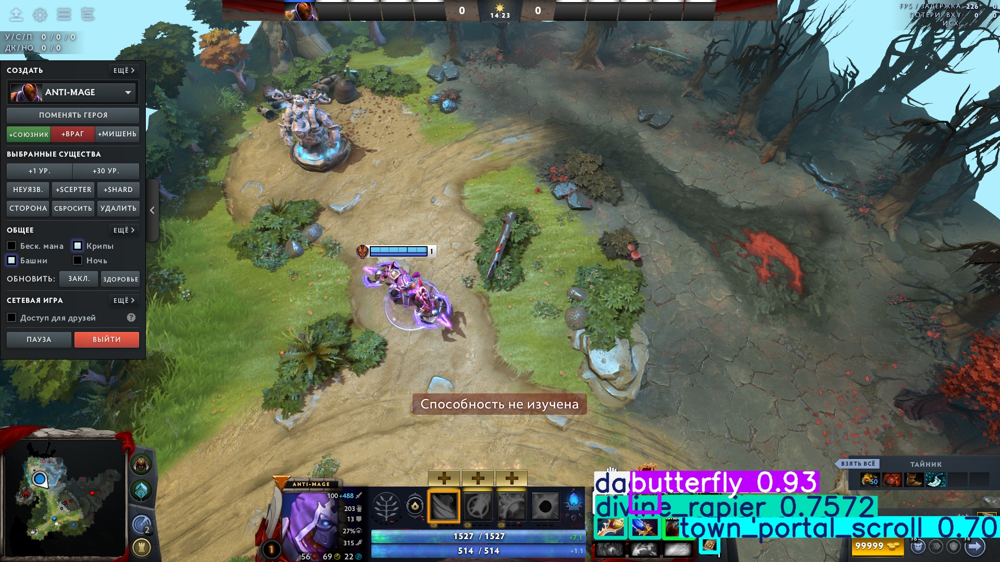

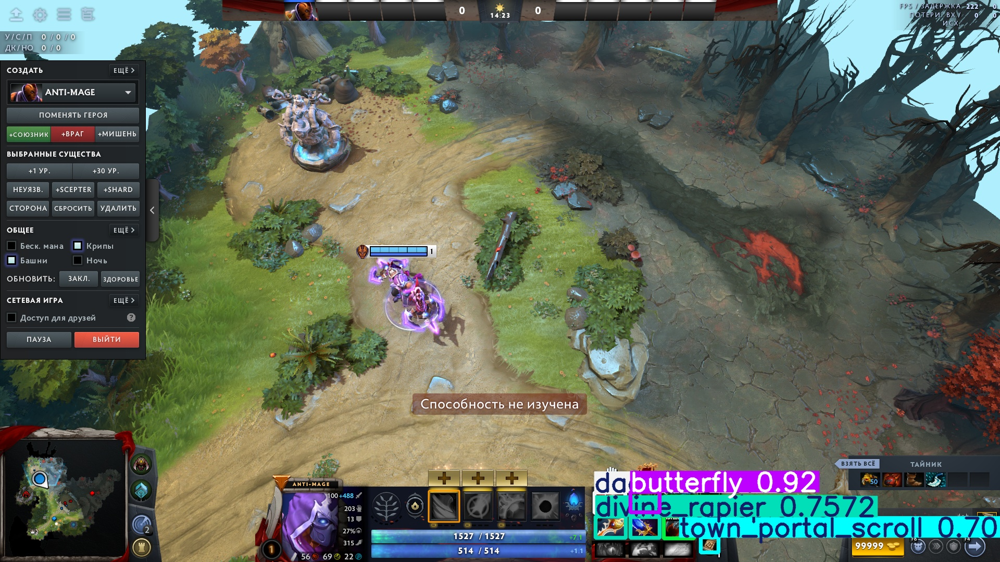

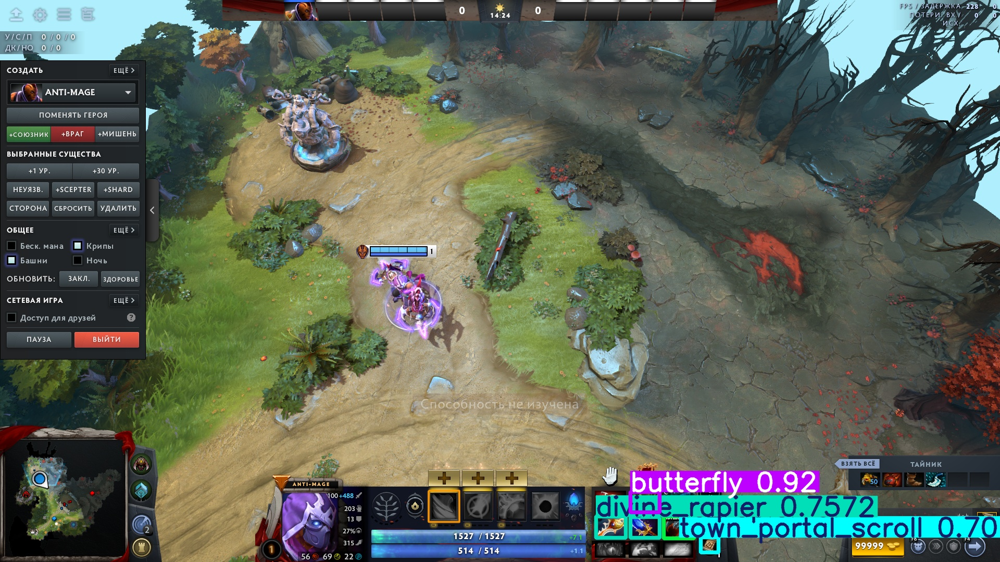

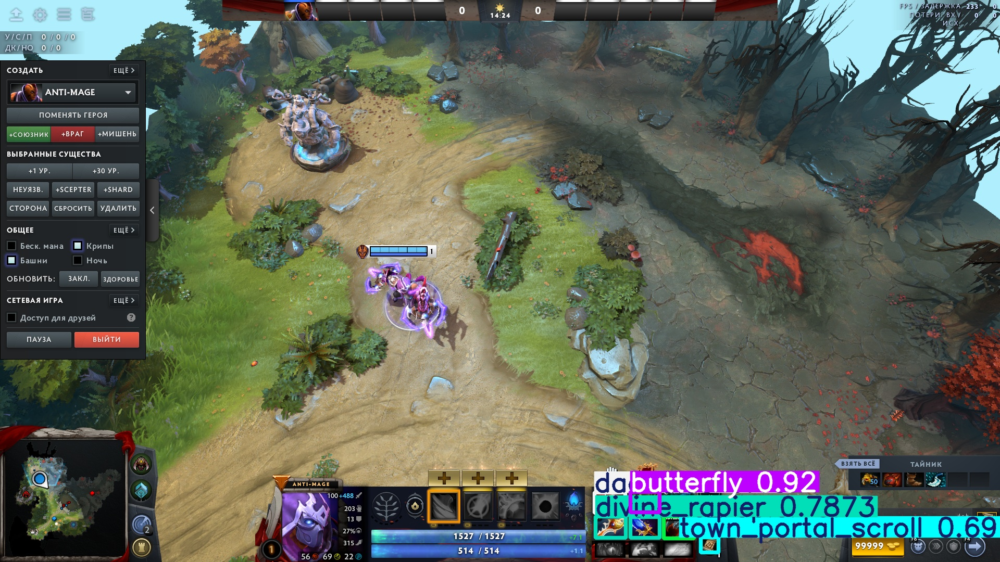

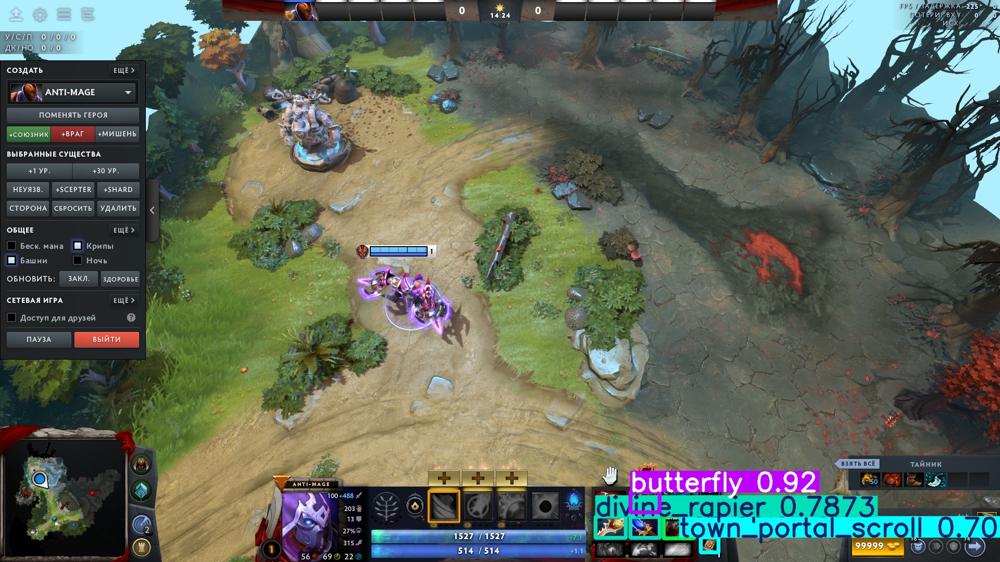

In [69]:
from IPython.display import Image as IPythonImage, display

PREDICTIONS_DIR = PROJECT_DIR / "runs" / "test_predictions_conf015-2"

prediction_images = sorted([
    path for path in PREDICTIONS_DIR.iterdir()
    if path.suffix.lower() in IMAGE_EXTENSIONS
])

print("Количество изображений с предсказаниями:", len(prediction_images))

for image_path in prediction_images[:5]:
    display(IPythonImage(filename=str(image_path)))

Количество изображений с предсказаниями: 50


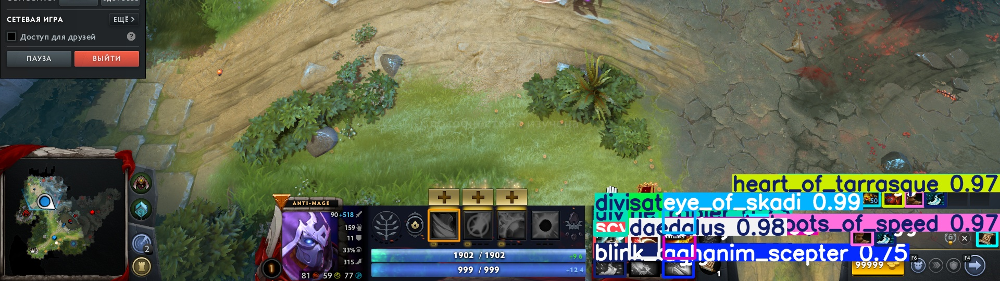

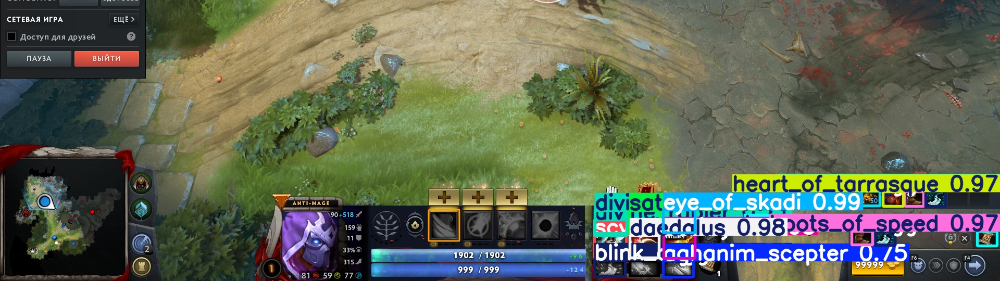

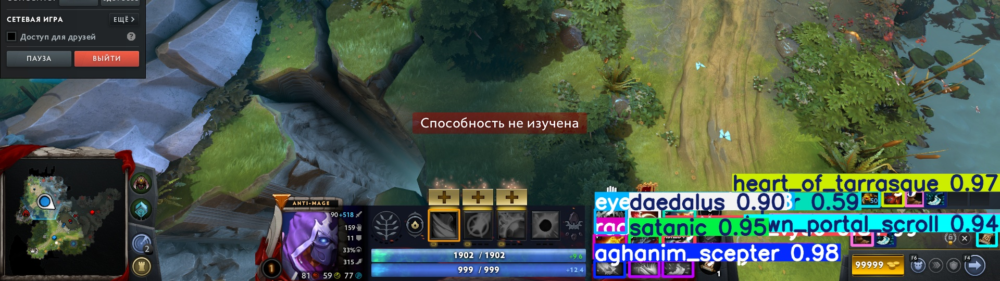

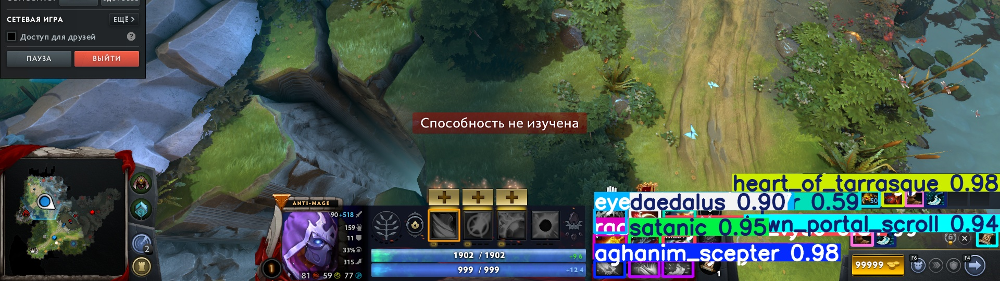

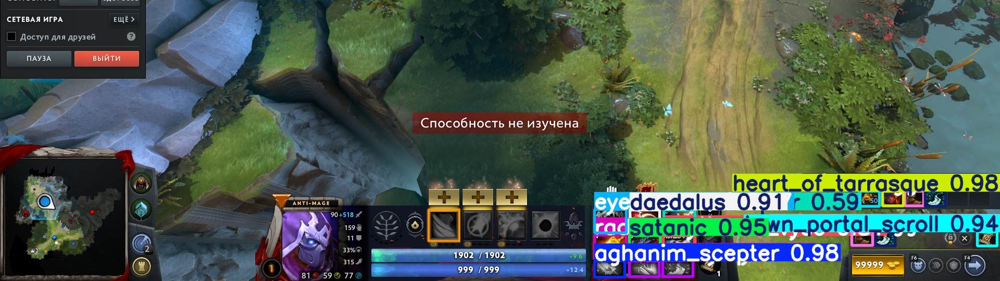

In [68]:
from IPython.display import Image as IPythonImage, display

PREDICTIONS_DIR = PROJECT_DIR / "runs" / "crop_final_test_predictions"

prediction_images = sorted([
    path for path in PREDICTIONS_DIR.iterdir()
    if path.suffix.lower() in IMAGE_EXTENSIONS
])

print("Количество изображений с предсказаниями:", len(prediction_images))

for image_path in prediction_images[:5]:
    display(IPythonImage(filename=str(image_path)))

## Визуальное сравнение предсказаний первой и второй модели

После обучения второй модели были сохранены изображения с предсказаниями на тестовой выборке.  
Визуальная проверка показала, что качество детекции заметно улучшилось по сравнению с первой моделью.

В первой версии эксперимента модель в основном находила только часть предметов и плохо работала с дополнительными областями интерфейса. Особенно плохо определялись предметы, расположенные в `backpack`, `stash` и `quick buy`. Это было связано с тем, что Roboflow-датасет имел другой вариант расположения HUD, поэтому модель плохо переносилась на собственные скриншоты.

После формирования финального crop-датасета ситуация улучшилась. Вторая модель начала находить предметы не только в основном инвентаре, но также в:

- `backpack`;
- `stash`;
- `quick buy`.

Это подтверждает, что выбранные изменения были полезны:

- crop нижней части экрана увеличил относительный размер предметов;
- удаление лишней части изображения помогло сфокусировать модель на интерфейсе;
- добавление части собственных изображений в `train` и `val` позволило модели адаптироваться к пользовательскому варианту HUD.

На изображениях видно, что модель уверенно определяет многие предметы в разных областях интерфейса.  
При этом остаются отдельные ошибки: некоторые подписи перекрывают друг друга, а отдельные предметы могут быть перепутаны или пропущены. Это связано с малым размером иконок, плотным расположением объектов и визуальной похожестью некоторых предметов.

В целом визуальная проверка подтверждает результаты метрик: вторая модель значительно лучше работает на собственных скриншотах, чем первая модель.

## Итоговое сравнение двух экспериментов

В ходе работы были выполнены два эксперимента.

В первом эксперименте модель обучалась на очищенном Roboflow-датасете и проверялась на собственных изображениях.  
Несмотря на высокое качество на Roboflow-validation, модель плохо работала на собственном тесте из-за различия интерфейса и расположения объектов.

Во втором эксперименте был сформирован финальный crop-датасет.  
В нём использовалась только нижняя часть интерфейса, а часть собственных изображений была добавлена в обучающую и валидационную выборки.

Сравнение качества на собственных тестовых изображениях:

| Метрика | Первая модель | Вторая модель |
|---|---:|---:|
| Precision | 0.322 | 0.767 |
| Recall | 0.361 | 0.722 |
| mAP50 | 0.316 | 0.794 |
| mAP50-95 | 0.218 | 0.709 |

Таким образом, вторая модель показала значительно более высокое качество на собственных изображениях.  
Это подтверждает, что для задач компьютерного зрения важно не только количество данных, но и соответствие обучающего датасета реальным условиям применения модели.